In [78]:
import sys
sys.path.append('/project/FoolingDetection/pytorch')

import importlib
import lib.VisualizationProvider
import lib.FeatureProvider
import lib.StaticMetricProvider
importlib.reload(lib.VisualizationProvider)
importlib.reload(lib.FeatureProvider)
importlib.reload(lib.StaticMetricProvider)

from lib.VisualizationProvider import (plot_2d_distributions, 
                                       plot_2d_distributions2,
                                       plot_scatter, 
                                       plot_scatter2,
                                       plot_gaussian_distributions,
                                       plot_heatmap,
                                       plot_comparison_heatmaps
                                      )

from lib.FeatureProvider import (load_all_grids, 
                                 load_all_grids_randparams,
                                 reduce_dimensionality_umap, 
                                 reduce_dimensionality_kpca, 
                                 reduce_dimensionality_tsne
                                )

from lib.StaticMetricProvider import (test_all_introspection_technique_combinations, 
                                      calc_distributions, 
                                      get_values_from_distance_matrix, 
                                      difference_distances, 
                                      apply_log_to_distances,
                                      calculate_stats
                                     )
from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import KernelPCA

# Base Code 

In [2]:
MODEL_TYPE = "mlp"
DATASET = "cifar10"
ATTACK1 = "correct"
ATTACK2 = "RandLabels"
ATTACK3 = "RandParams/Cascading/4_Linear"
MAX_IMAGES = 300
RANDOM_STATE = 42
NUMBER_COMPONENTS = 2

In [3]:
all_grids_1 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK1, 
    max_images=MAX_IMAGES
)
all_grids_2 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK2, 
    max_images=MAX_IMAGES
)

all_grids_3 = load_all_grids(
    model_type=MODEL_TYPE, 
    dataset=DATASET, 
    attack=ATTACK3, 
    max_images=MAX_IMAGES
)

distances_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_NoAttacked_RandLabels = difference_distances(
    reference=distances_1, 
    delta=distances_2, 
    fold_change_and_log_scale=True
)

difference_NoAttacked_RandParams = difference_distances(
    reference=distances_1, 
    delta=distances_3, 
    fold_change_and_log_scale=True
)

Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 out of 300 (100.00%)
Loading grids from disk...
Loading image 50 out of 300 (16.67%)
Loading image 100 out of 300 (33.33%)
Loading image 150 out of 300 (50.00%)
Loading image 200 out of 300 (66.67%)
Loading image 250 out of 300 (83.33%)
Loading image 300 o

In [4]:
# UMap Reducer Object
umap_reducer = UMAP(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE)


# UMap Transform
all_grids_1_umap = reduce_dimensionality_umap(all_grids_1, umap_reducer)
all_grids_2_umap = reduce_dimensionality_umap(all_grids_2, umap_reducer)
all_grids_3_umap = reduce_dimensionality_umap(all_grids_3, umap_reducer)


distances_umap_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_umap_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_umap, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_umap_NoAttacked_RandLabels = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_2, 
    fold_change_and_log_scale=True
)

difference_umap_NoAttacked_RandParams = difference_distances(
    reference=distances_umap_1, 
    delta=distances_umap_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique backprop...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ponel/python/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Reducing dimensionality for technique dl...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique g_t_i...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique ig...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Reducing dimensionality for technique vgrads...


/scratch/ponel/python/lib/python3.8/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/scratch/ponel/python/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [5]:
# TSNE Reducer Object
tsne_reducer = TSNE(n_components=NUMBER_COMPONENTS, random_state=RANDOM_STATE, n_jobs=-1)

# TSNE Transform
all_grids_1_tsne =reduce_dimensionality_tsne(all_grids_1, tsne_reducer)
all_grids_2_tsne =reduce_dimensionality_tsne(all_grids_2, tsne_reducer)
all_grids_3_tsne =reduce_dimensionality_tsne(all_grids_3, tsne_reducer)

distances_tsne_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_tsne_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_tsne, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_tsne_NoAttacked_RandLabels = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_2, 
    fold_change_and_log_scale=True
)

difference_tsne_NoAttacked_RandParams = difference_distances(
    reference=distances_tsne_1, 
    delta=distances_tsne_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...


In [6]:
# kPCA Transform
# kPCA-Linear Reducer Object
kpca_linear_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="linear", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

# Linear kernel
all_grids_1_kpca_linear = reduce_dimensionality_kpca(all_grids_1, kpca_linear_reducer)
all_grids_2_kpca_linear = reduce_dimensionality_kpca(all_grids_2, kpca_linear_reducer)
all_grids_3_kpca_linear = reduce_dimensionality_kpca(all_grids_3, kpca_linear_reducer)

distances_kcpa_linear_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_linear_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_linear, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_linear_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_2, 
    fold_change_and_log_scale=True
)

difference_kpca_linear_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_linear_1, 
    delta=distances_kcpa_linear_3, 
    fold_change_and_log_scale=True
)

# Poly kernel

# kPCA-Poly Reducer Object
kpca_poly_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="poly", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_poly = reduce_dimensionality_kpca(all_grids_1, kpca_poly_reducer)
all_grids_2_kpca_poly = reduce_dimensionality_kpca(all_grids_2, kpca_poly_reducer)
all_grids_3_kpca_poly = reduce_dimensionality_kpca(all_grids_3, kpca_poly_reducer)

distances_kcpa_poly_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_poly_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_poly, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_poly_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_2, 
    fold_change_and_log_scale=True
)

difference_kpca_poly_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_poly_1, 
    delta=distances_kcpa_poly_3, 
    fold_change_and_log_scale=True
)

# Cosine kernel
# kPCA-Cosine Reducer Object
kpca_cosine_reducer = KernelPCA(
        n_components=NUMBER_COMPONENTS, 
        kernel="cosine", 
        gamma=.1, 
        eigen_solver="auto", 
        random_state=RANDOM_STATE, 
        alpha=10)

all_grids_1_kpca_cosine = reduce_dimensionality_kpca(all_grids_1, kpca_cosine_reducer)
all_grids_2_kpca_cosine = reduce_dimensionality_kpca(all_grids_2, kpca_cosine_reducer)
all_grids_3_kpca_cosine = reduce_dimensionality_kpca(all_grids_3, kpca_cosine_reducer)

distances_kcpa_cosine_1, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_1_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_2, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_2_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)
distances_kcpa_cosine_3, techniques, distance_functions = test_all_introspection_technique_combinations(
    grids=all_grids_3_kpca_cosine, 
    print_results=False, 
    average_results=False,
    use_ssim=False
)

difference_kpca_cosine_NoAttacked_RandLabels = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_2, 
    fold_change_and_log_scale=True
)

difference_kpca_cosine_NoAttacked_RandParams = difference_distances(
    reference=distances_kcpa_cosine_1, 
    delta=distances_kcpa_cosine_3, 
    fold_change_and_log_scale=True
)

Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimensionality for technique dl...
Reducing dimensionality for technique g_t_i...
Reducing dimensionality for technique ig...
Reducing dimensionality for technique vgrads...
Reducing dimensionality for technique backprop...
Reducing dimension

# Lower-Dimensional Comparison (Aggregated)
Map the unattacked and an attacked version to a lower_dim space (n=2) and see how the distributions in this lower-dim space differ!

## Normal (Left) vs. RandLabels (Middle) vs. RandParams (Right)

### UMap

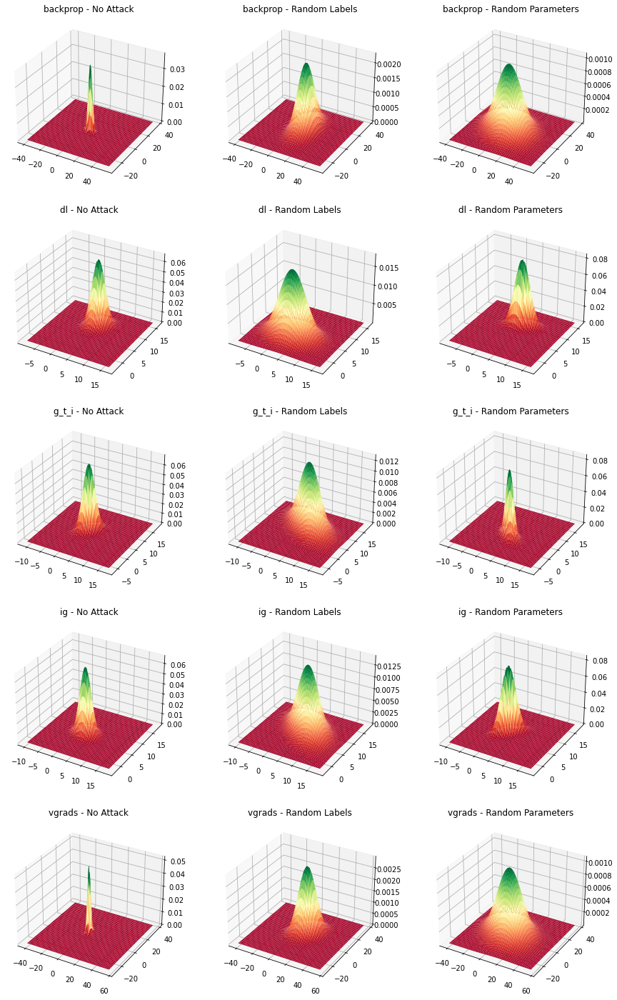

In [79]:
plot_2d_distributions2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

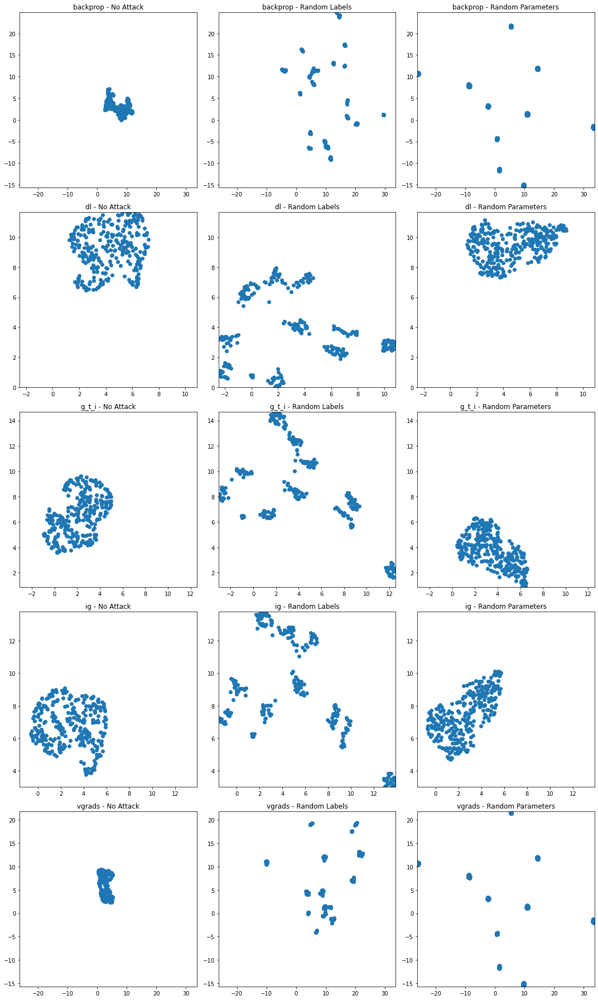

In [80]:
plot_scatter2(all_grids_1_umap, all_grids_2_umap, all_grids_3_umap, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [81]:
calculate_stats(all_grids_1_umap, all_grids_2_umap,  all_grids_3_umap)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,7.068011,2.798609,3.131930,1.683910
1,backprop,Grids 2,9.931924,7.435812,6.146791,9.393418
2,backprop,Grids 3,4.572494,15.016203,1.735933,10.397423
3,dl,Grids 1,4.247540,1.678028,9.200257,1.449295
4,dl,Grids 2,3.140363,3.898748,3.800090,2.272576
5,dl,Grids 3,4.664883,2.087407,9.473619,0.967129
6,g_t_i,Grids 1,2.064924,1.547514,6.543319,1.640748
7,g_t_i,Grids 2,4.191446,4.419919,8.545693,3.334504
8,g_t_i,Grids 3,3.586679,1.740725,3.681611,1.338374
9,ig,Grids 1,2.773930,1.915690,6.744398,1.259037


### kPCA (Linear)

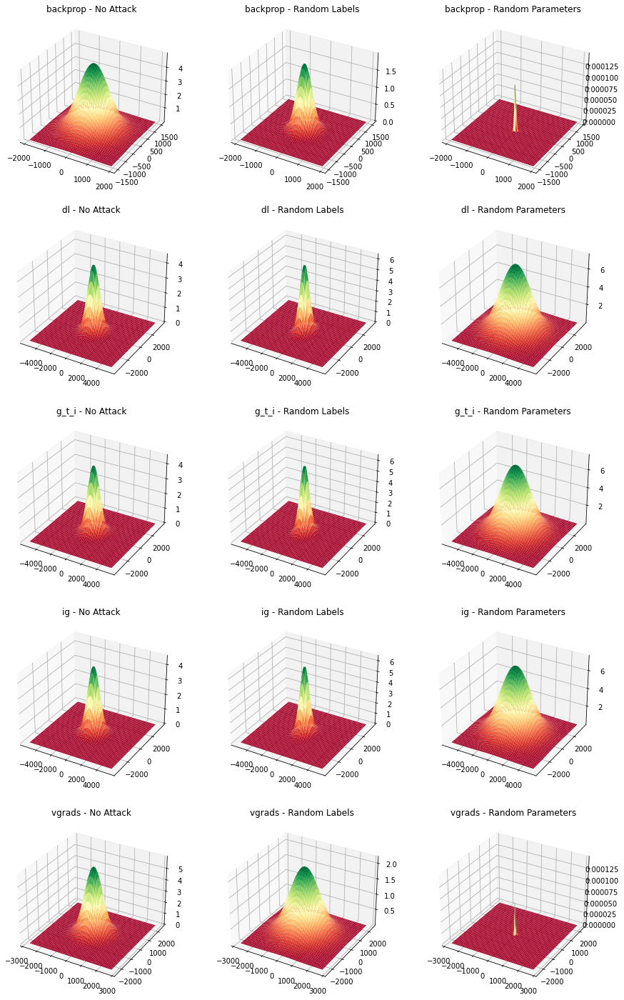

In [82]:
plot_2d_distributions2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

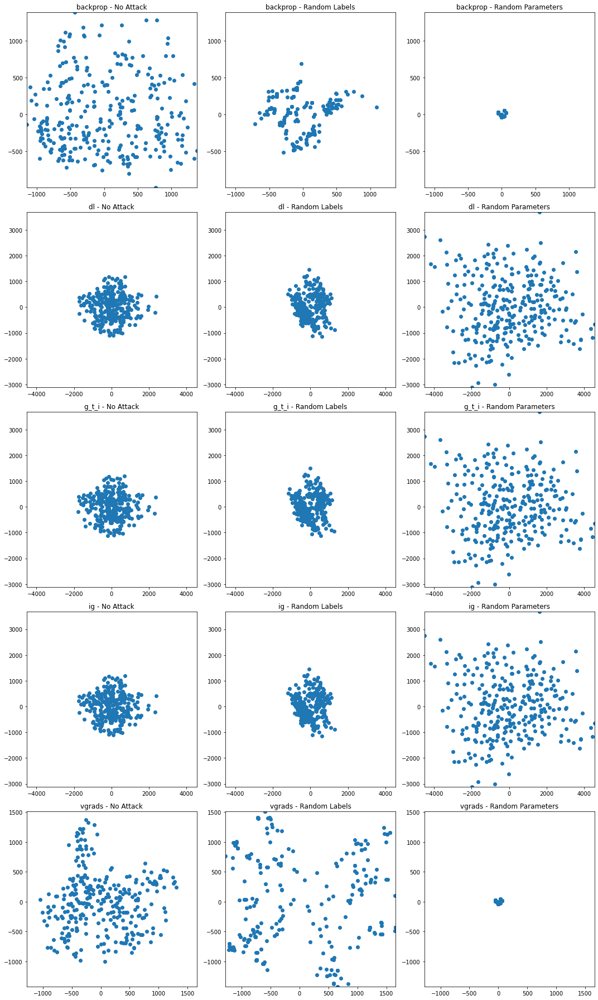

In [83]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [84]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-2.213104e-13,644.586825,-1.349084e-13,499.385874
1,backprop,Grids 2,7.275958e-14,322.009348,2.758801e-13,253.520053
2,backprop,Grids 3,2.117678e-12,37.055825,-1.800421e-12,28.932914
3,dl,Grids 1,1.333926e-13,715.414646,-2.213104e-13,492.347192
4,dl,Grids 2,-2.061521e-13,515.142122,-7.730705e-14,486.368456
5,dl,Grids 3,-3.031649e-14,1801.489037,8.033870e-14,1175.389749
6,g_t_i,Grids 1,-2.182787e-13,715.943620,-2.091838e-13,493.553232
7,g_t_i,Grids 2,1.242976e-13,511.314722,7.730705e-14,484.735238
8,g_t_i,Grids 3,-4.850638e-14,1801.489054,-1.227818e-13,1175.389851
9,ig,Grids 1,1.758356e-13,715.853110,-3.668295e-13,492.271445


### kPCA (poly)

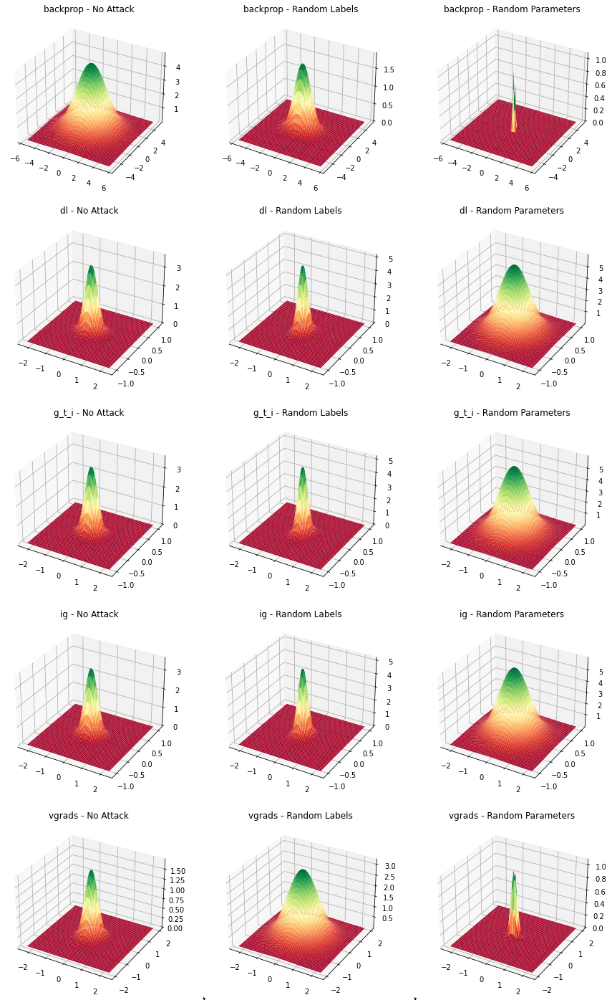

In [85]:
plot_2d_distributions2(all_grids_1_kpca_poly, all_grids_2_kpca_poly, all_grids_3_kpca_poly, title1="No Attack", title2="Random Labels", title3="Random Parameters")

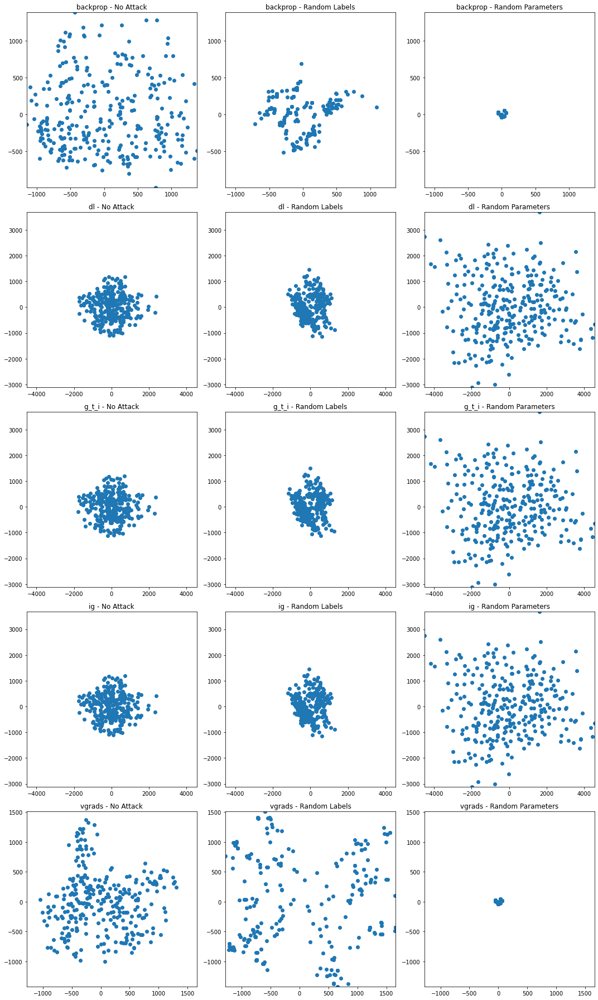

In [86]:
plot_scatter2(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [87]:
calculate_stats(all_grids_1_kpca_linear, all_grids_2_kpca_linear, all_grids_3_kpca_linear)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,-2.213104e-13,644.586825,-1.349084e-13,499.385874
1,backprop,Grids 2,7.275958e-14,322.009348,2.758801e-13,253.520053
2,backprop,Grids 3,2.117678e-12,37.055825,-1.800421e-12,28.932914
3,dl,Grids 1,1.333926e-13,715.414646,-2.213104e-13,492.347192
4,dl,Grids 2,-2.061521e-13,515.142122,-7.730705e-14,486.368456
5,dl,Grids 3,-3.031649e-14,1801.489037,8.033870e-14,1175.389749
6,g_t_i,Grids 1,-2.182787e-13,715.943620,-2.091838e-13,493.553232
7,g_t_i,Grids 2,1.242976e-13,511.314722,7.730705e-14,484.735238
8,g_t_i,Grids 3,-4.850638e-14,1801.489054,-1.227818e-13,1175.389851
9,ig,Grids 1,1.758356e-13,715.853110,-3.668295e-13,492.271445


### kPCA (cosine)

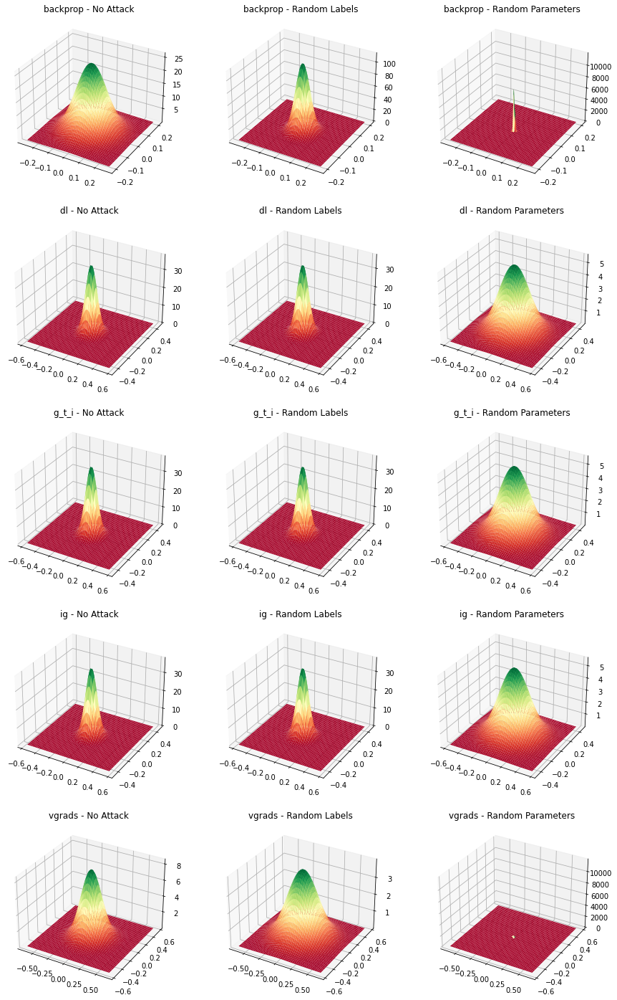

In [88]:
plot_2d_distributions2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

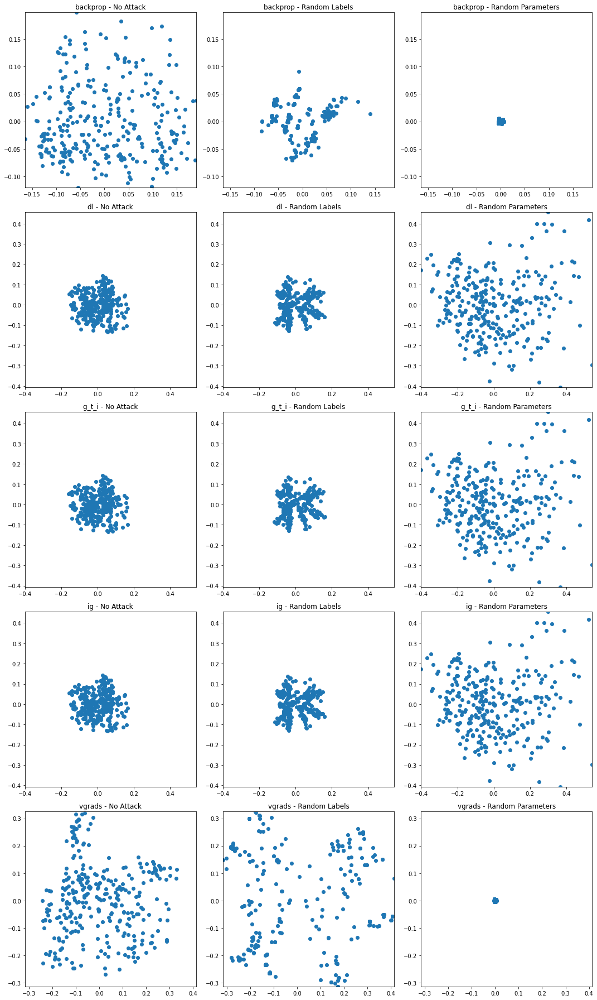

In [89]:
plot_scatter2(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [90]:
calculate_stats(all_grids_1_kpca_cosine, all_grids_2_kpca_cosine, all_grids_3_kpca_cosine)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,1.239749e-16,0.089118,4.474199e-16,0.068093
1,backprop,Grids 2,2.641683e-15,0.041688,-8.826273e-16,0.033764
2,backprop,Grids 3,3.086995e-14,0.003903,-5.937539e-15,0.003410
3,dl,Grids 1,1.458093e-16,0.070452,-2.316665e-16,0.060214
4,dl,Grids 2,4.633331e-16,0.070998,-2.668236e-16,0.060956
5,dl,Grids 3,2.294461e-17,0.190116,-1.406282e-17,0.150460
6,g_t_i,Grids 1,2.151982e-16,0.070353,3.974598e-16,0.059987
7,g_t_i,Grids 2,-2.801463e-16,0.070707,9.181544e-16,0.060677
8,g_t_i,Grids 3,2.960595e-17,0.190116,1.702342e-17,0.150460
9,ig,Grids 1,1.730098e-16,0.070440,1.036208e-17,0.060197


### t-SNE

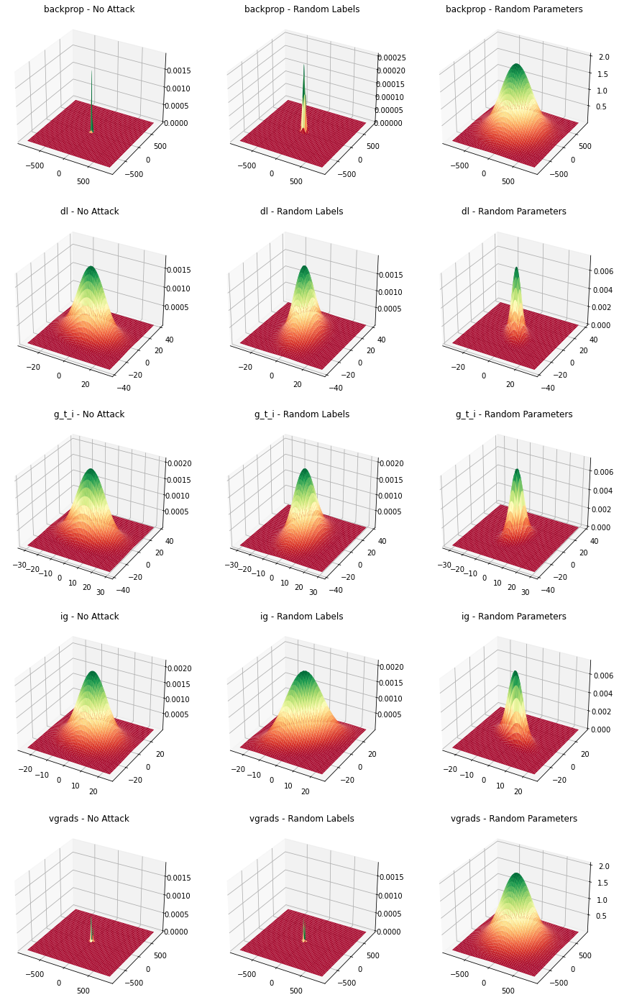

In [91]:
# (this execution works but takes ages...)
plot_2d_distributions2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

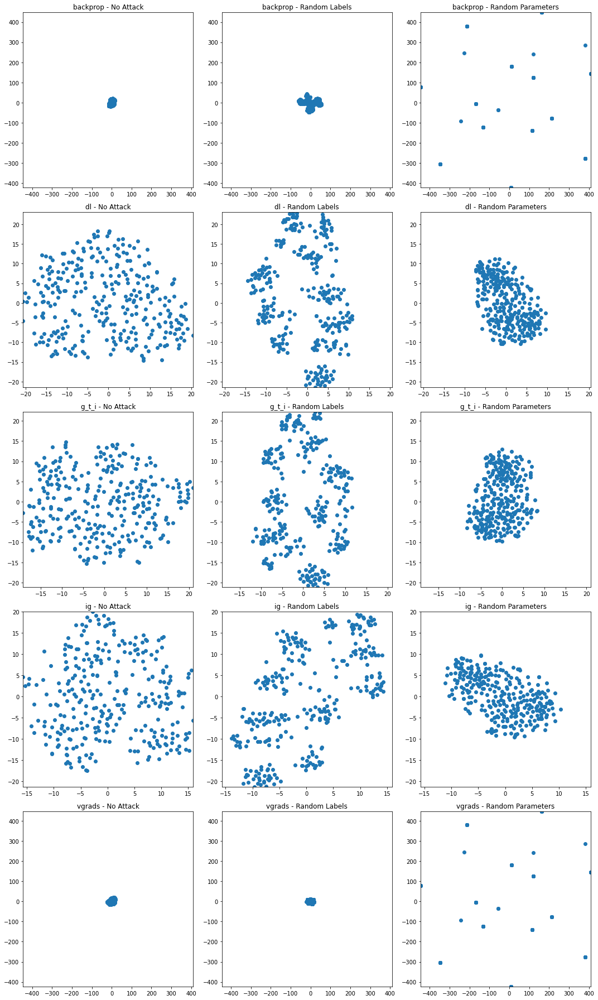

In [92]:
plot_scatter2(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne, title1="No Attack", title2="Random Labels", title3="Random Parameters")

In [93]:
calculate_stats(all_grids_1_tsne, all_grids_2_tsne, all_grids_3_tsne)

,Technique,Grid,Mean(1),Standard Deviation(1),Mean(2),Standard Deviation(2)
0,backprop,Grids 1,0.301148,7.897738,0.007806,11.374080
1,backprop,Grids 2,-1.545938,30.600069,-1.592774,20.575750
2,backprop,Grids 3,-6.430884,282.855286,1.565714,276.378815
3,dl,Grids 1,-0.600910,10.493632,0.561084,8.523938
4,dl,Grids 2,-0.643816,6.601108,1.358428,12.361001
5,dl,Grids 3,0.151432,4.172559,-0.135332,5.857940
6,g_t_i,Grids 1,-0.635296,10.096778,-0.319074,7.535448
7,g_t_i,Grids 2,-0.085398,6.241701,0.078887,12.214583
8,g_t_i,Grids 3,-0.264414,3.660754,0.718267,6.157907
9,ig,Grids 1,0.556347,7.794271,-0.240963,9.425069


# Per-Image Comparison 
For a combination of two Explanation Techniques (expl1, expl2) (e.g. expl1=DeepLift, expl2=vanillaGrads) compute the distance for each image in a **Lower and High Dimensional Space**. Finally, plot the distributions. 

This is also done for the difference of the distances. For this the distances for an attacked and non-attacked versions are calculated and then the difference is calculated using the fold_change on a logarithmic scale. Finally, this is plotted aswell.

In [94]:
METRIC="euclidean"

## High-Dimensional 

### No Attack

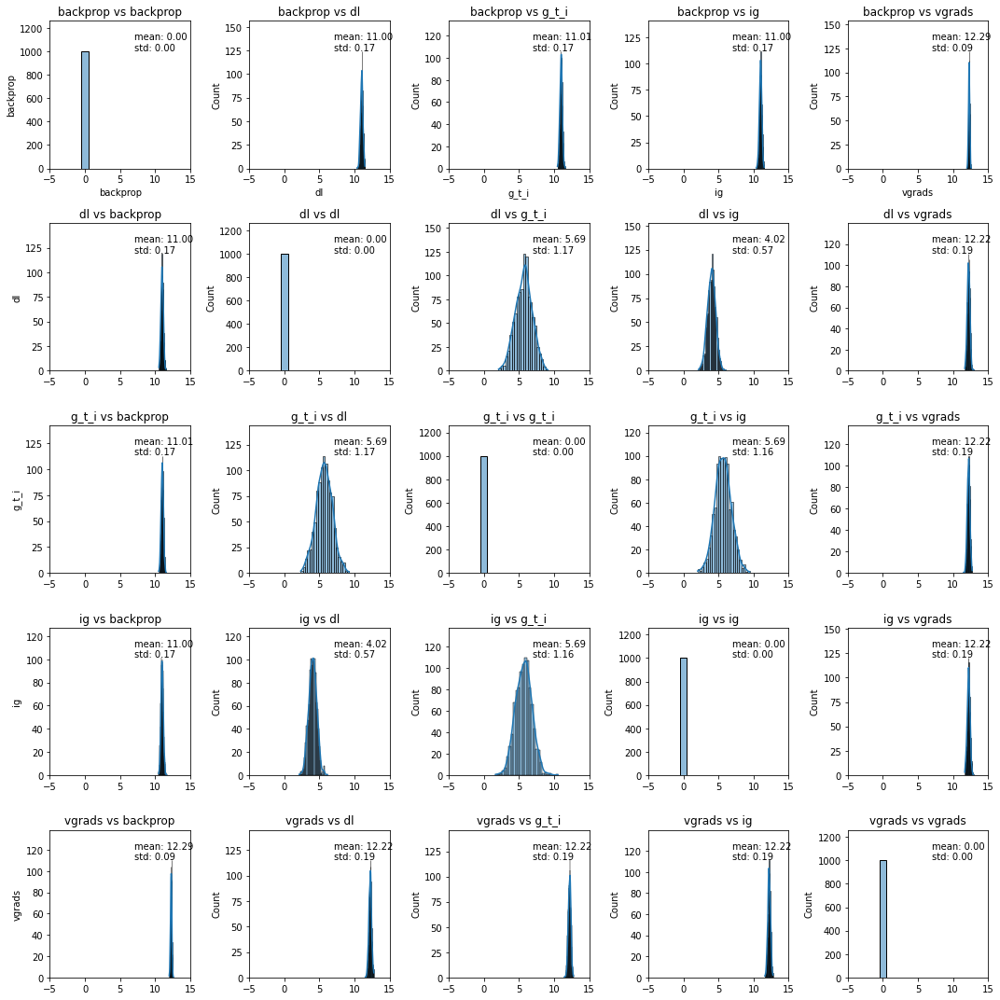

In [95]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_1), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_NoAttack_Mnist_cnn.png"

)

### RandLabels Attack

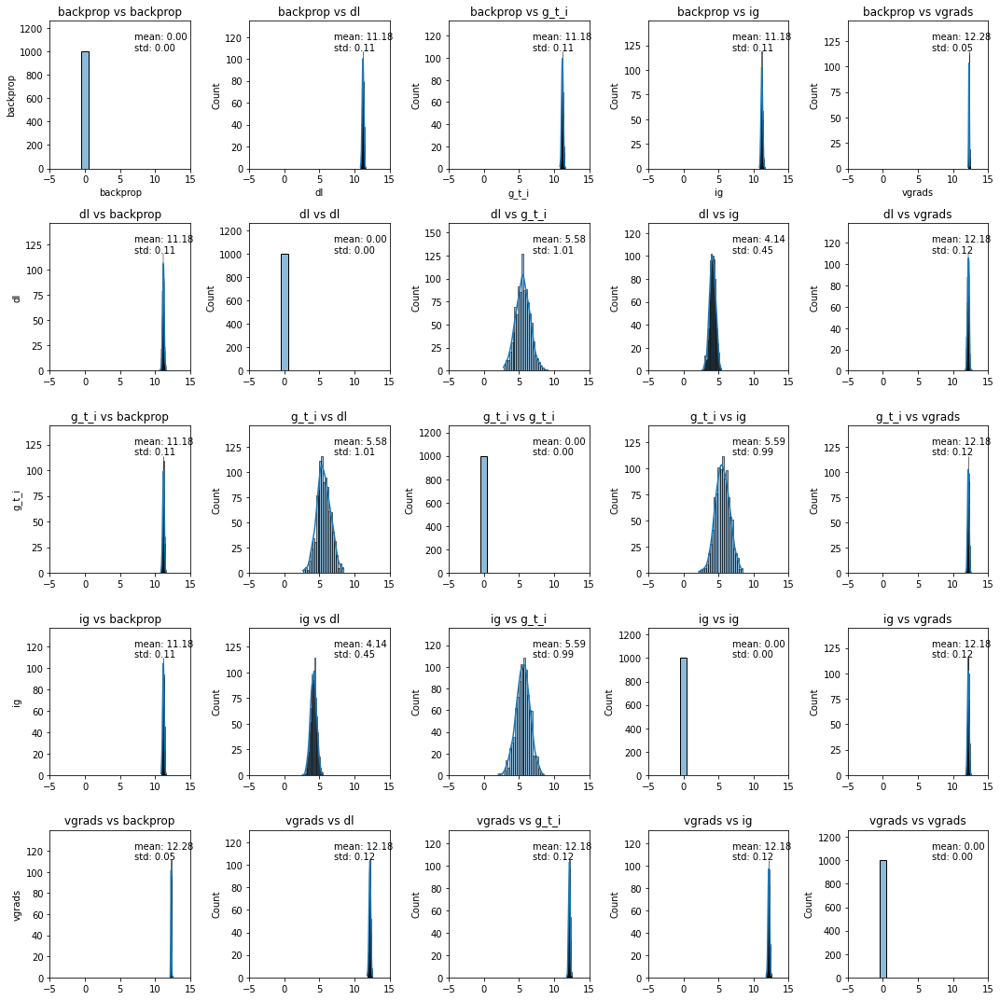

In [96]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_2), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandLabels_Mnist_cnn.png"
)

### RandParams Attack

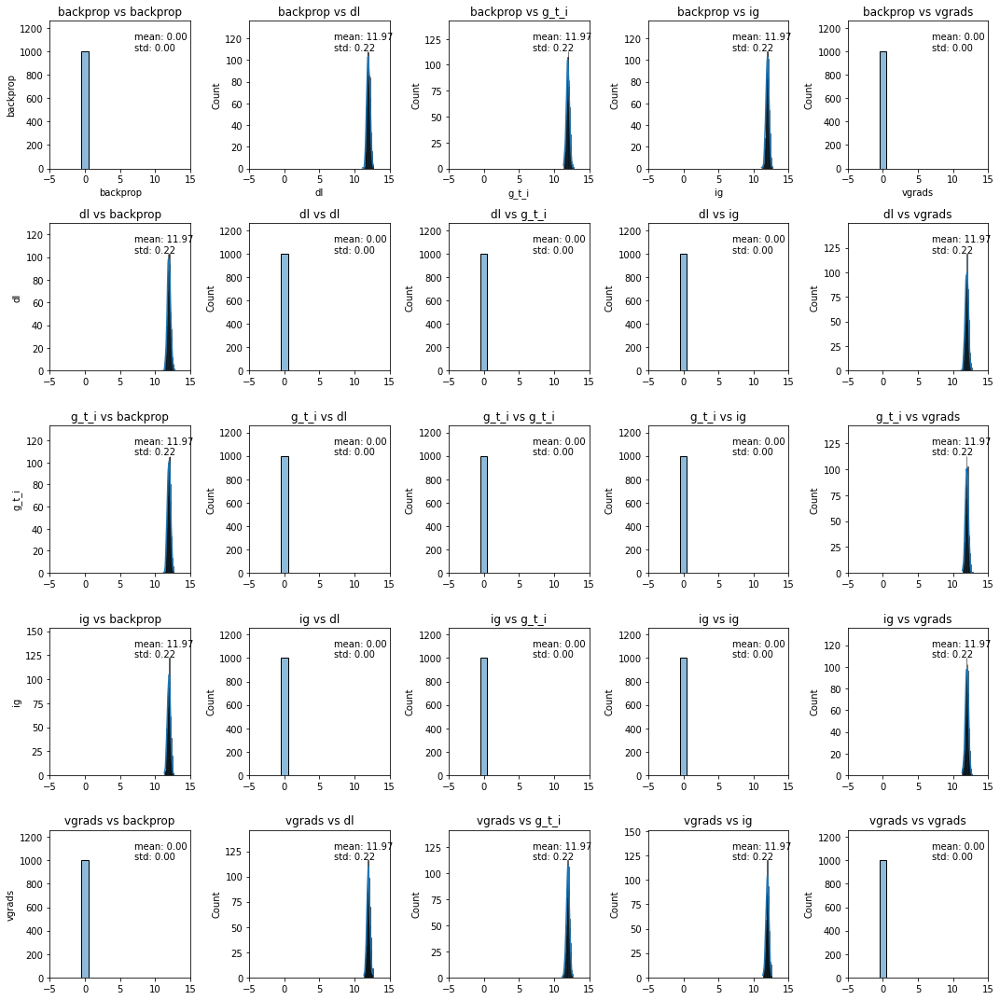

In [97]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_3), 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 15),
    save_name="Distributions_RandParams_Mnist_cnn.png"
)

### No Attack vs. RandLabels (Difference)

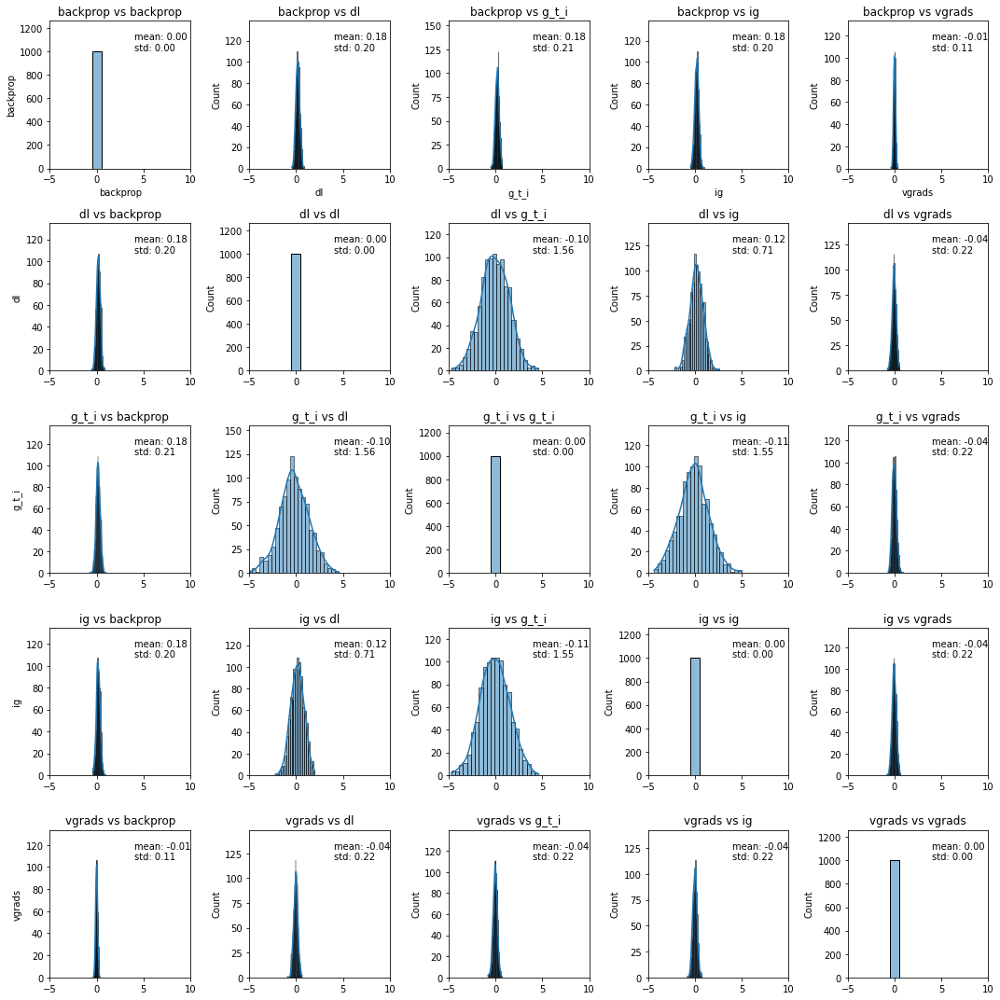

In [98]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-5, 10),
    save_name="Distributions_NoAttack_RandLabels_Mnist_cnn_diff.png"
)

### No Attack vs. RandParams (Difference)

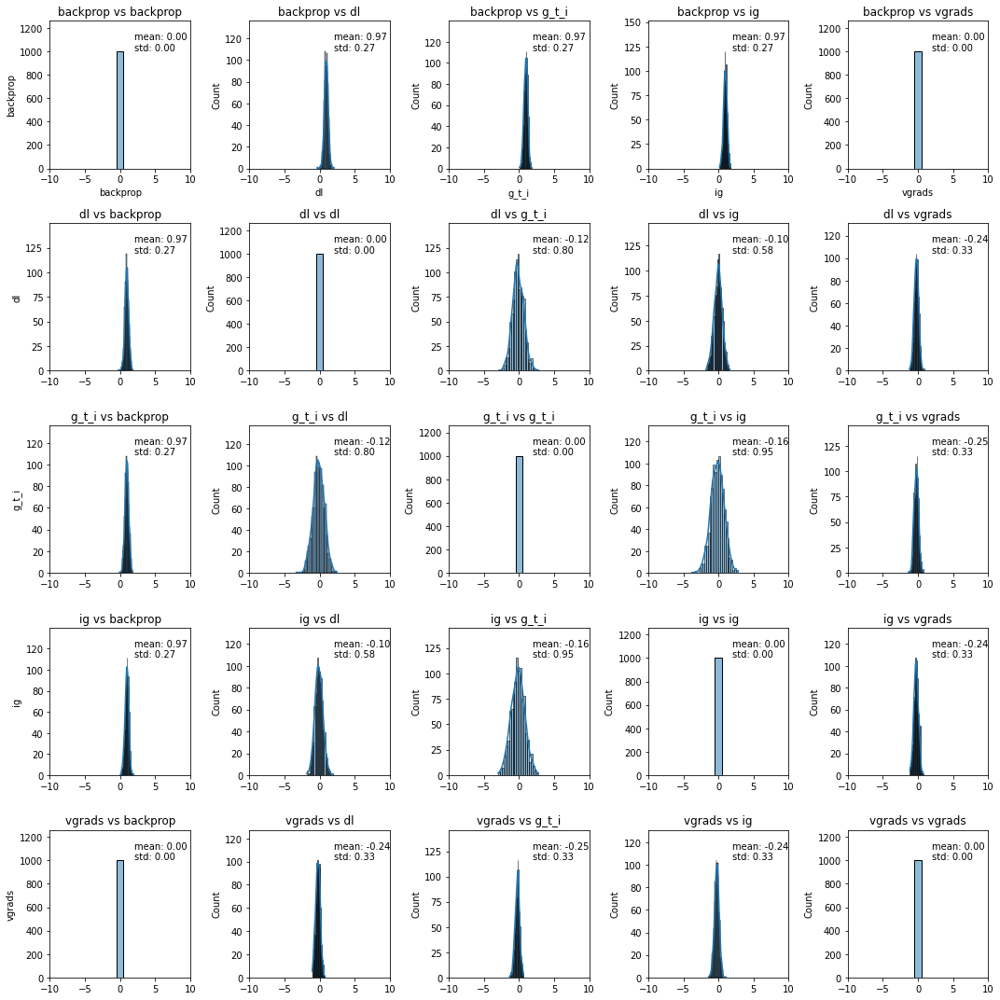

In [99]:
plot_gaussian_distributions(
    distances=difference_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC,
    value_range=(-10, 10),
    save_name="Distributions_NoAttack_RandParams_Mnist_cnn_diff.png"
)

## UMap

### No Attack

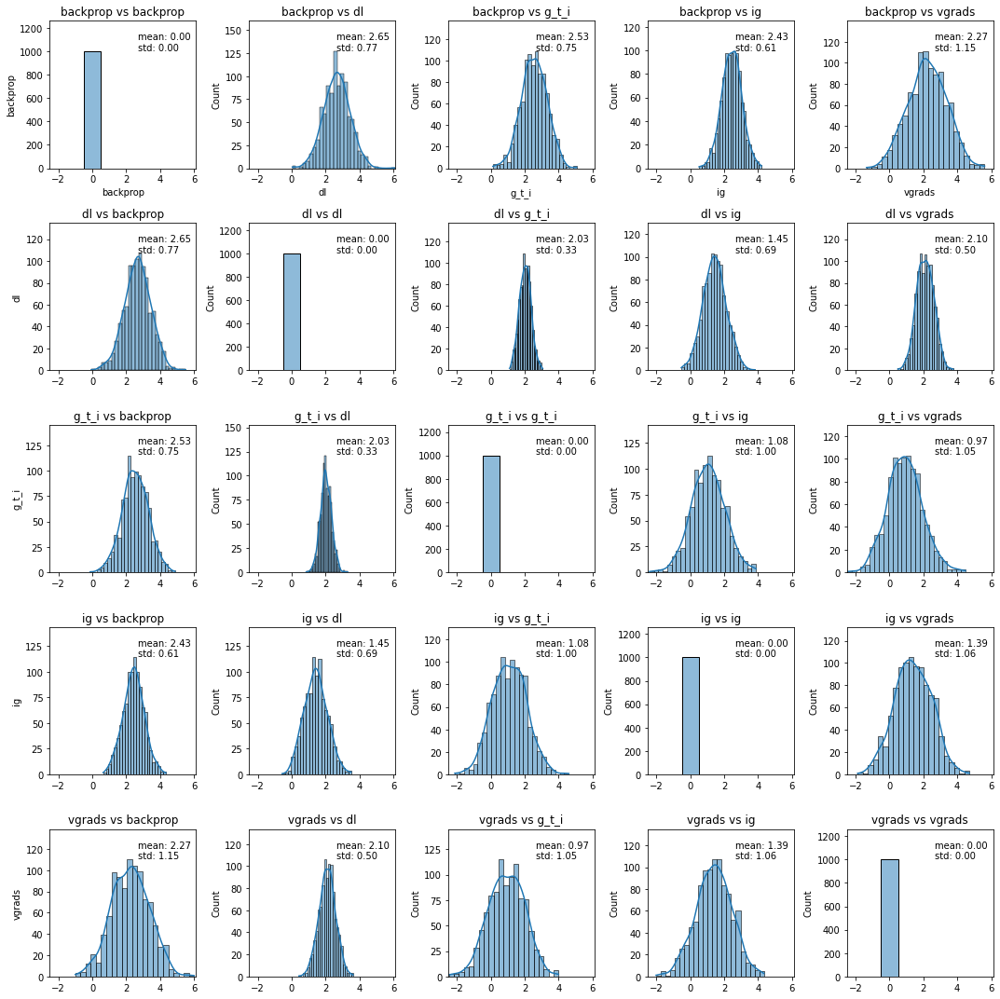

In [100]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

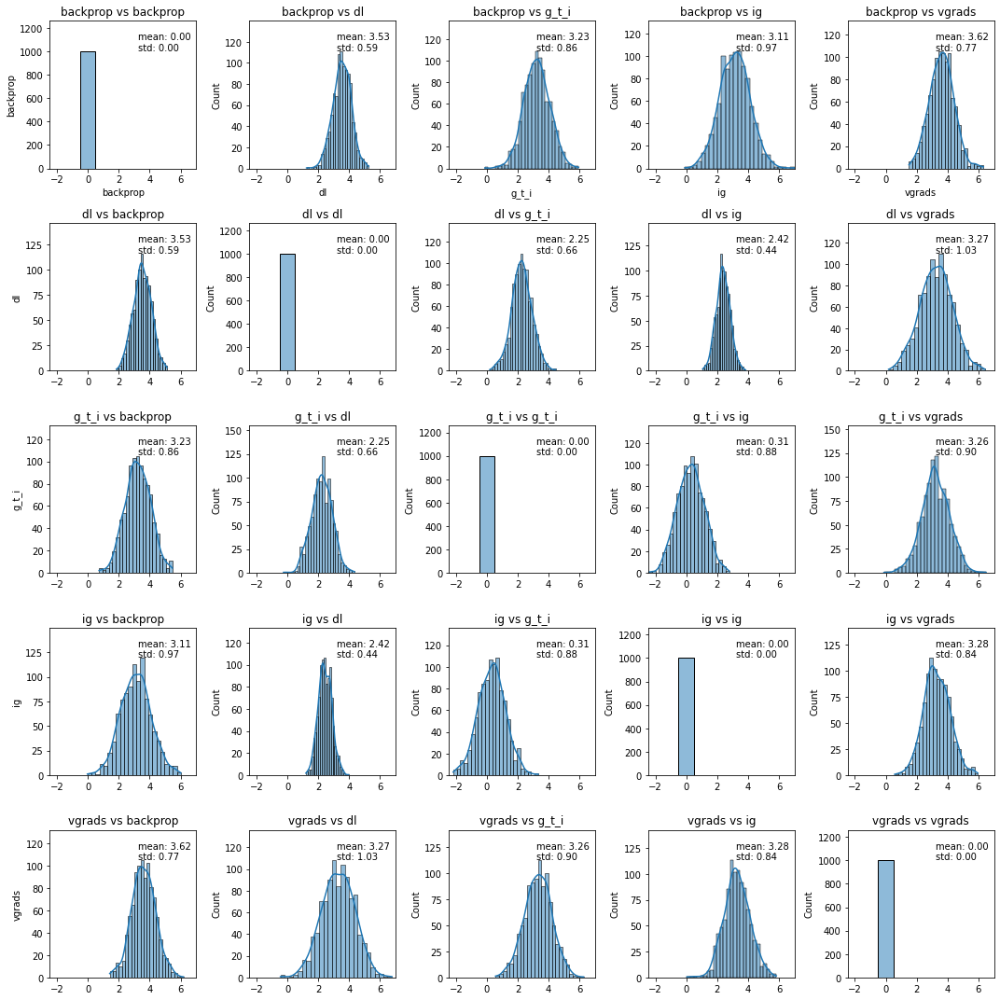

In [101]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

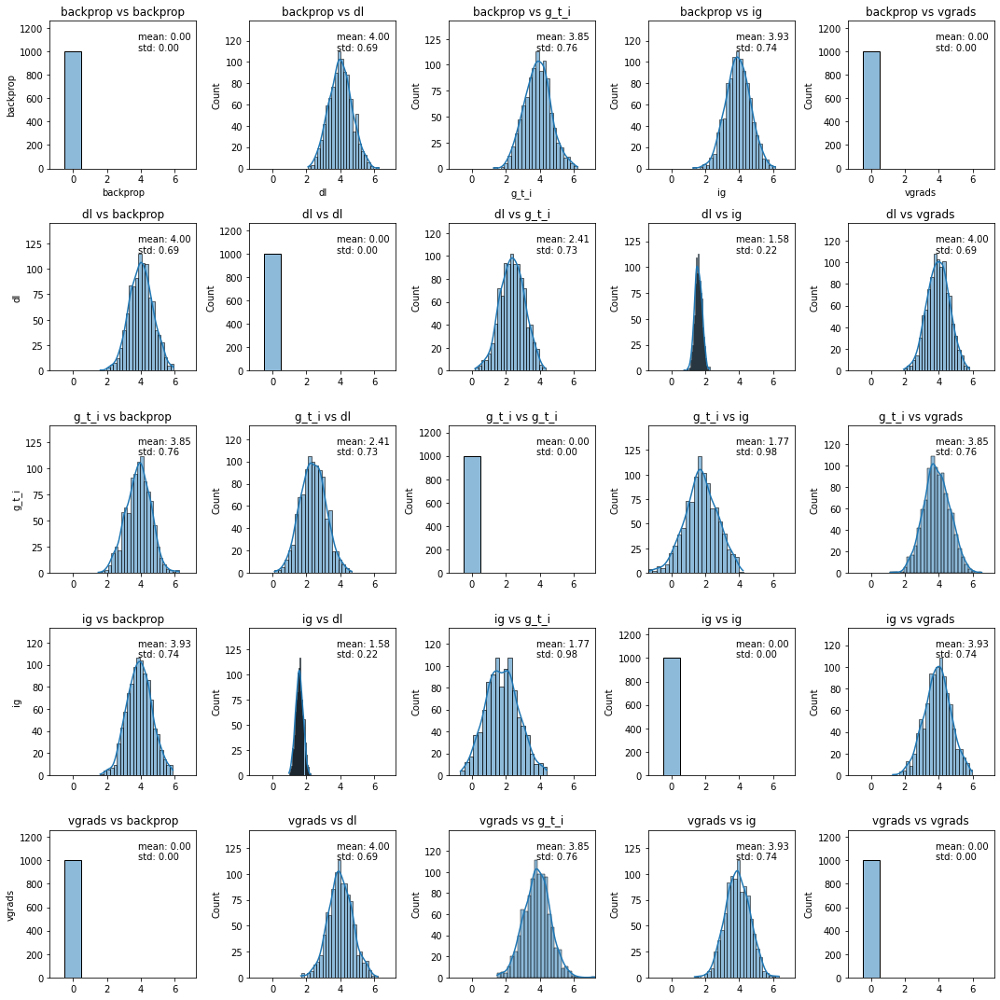

In [102]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_umap_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

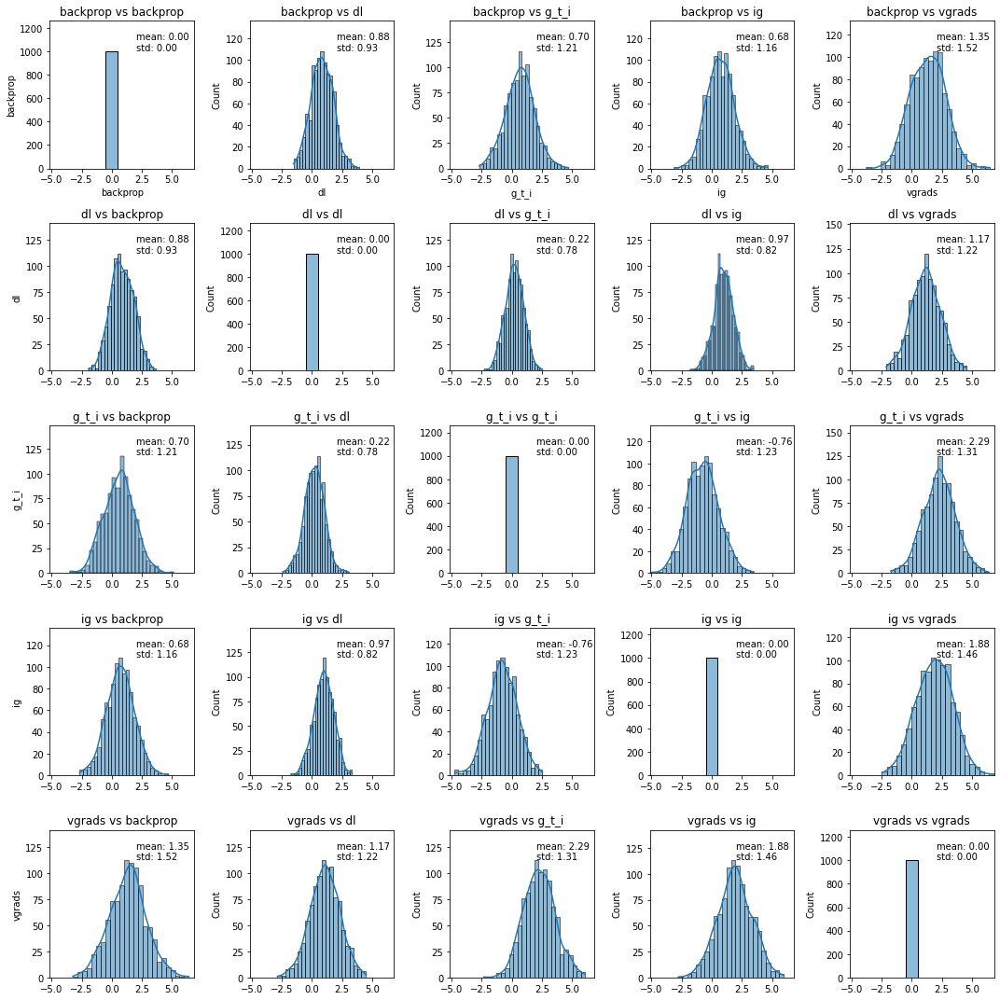

In [103]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

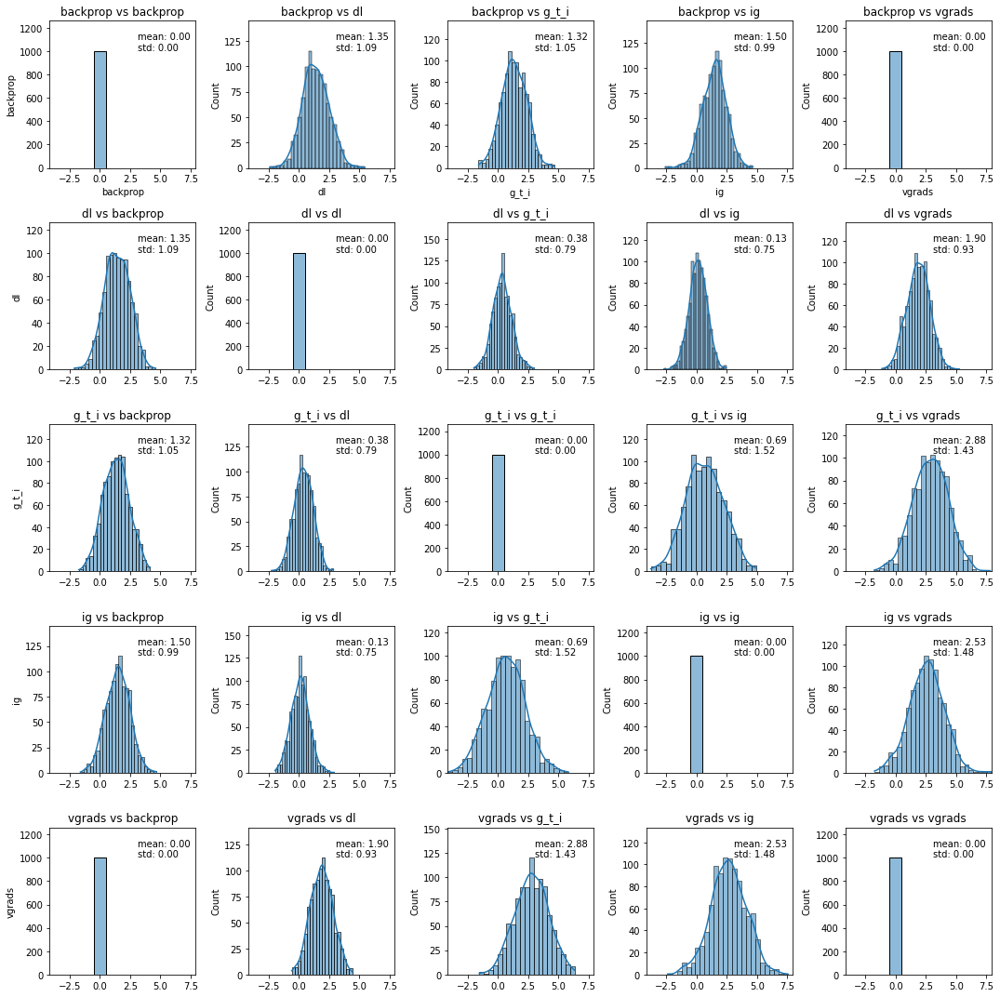

In [104]:
plot_gaussian_distributions(
    distances=difference_umap_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (Linear)

### No Attack

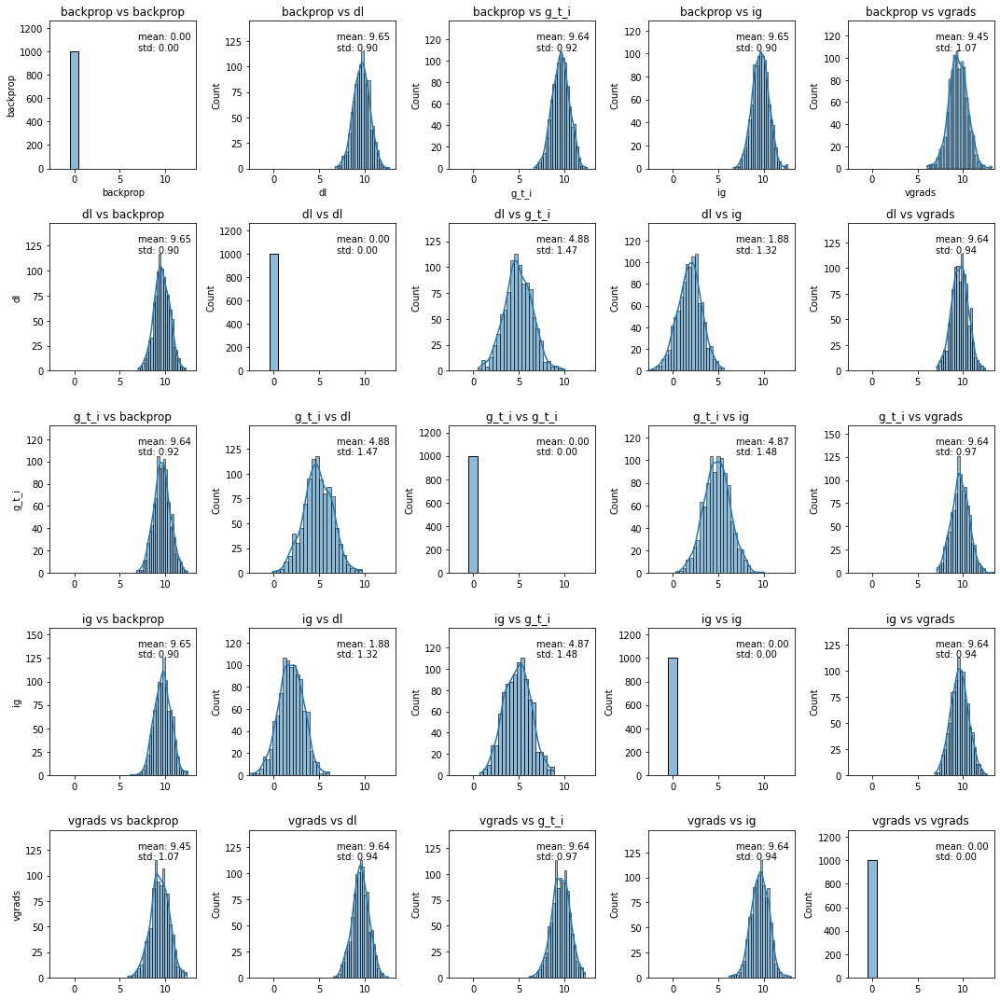

In [105]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

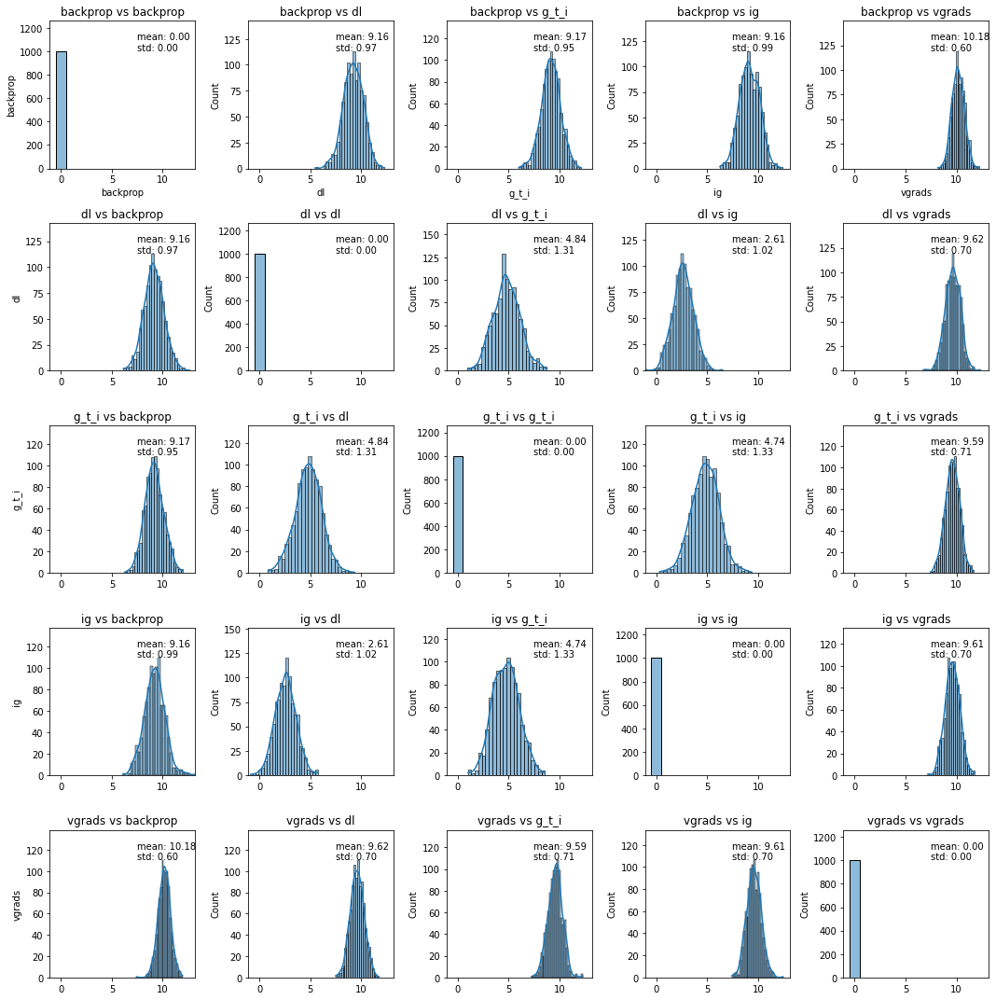

In [106]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

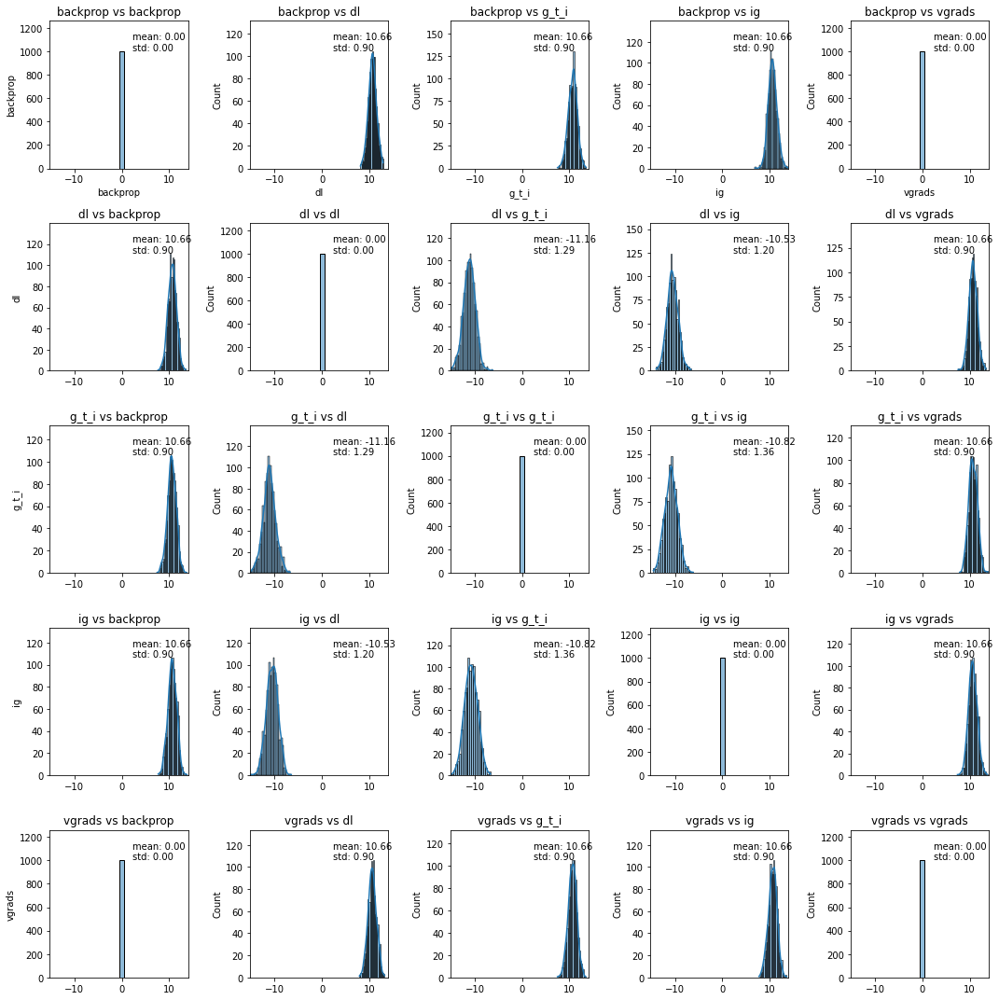

In [107]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_linear_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

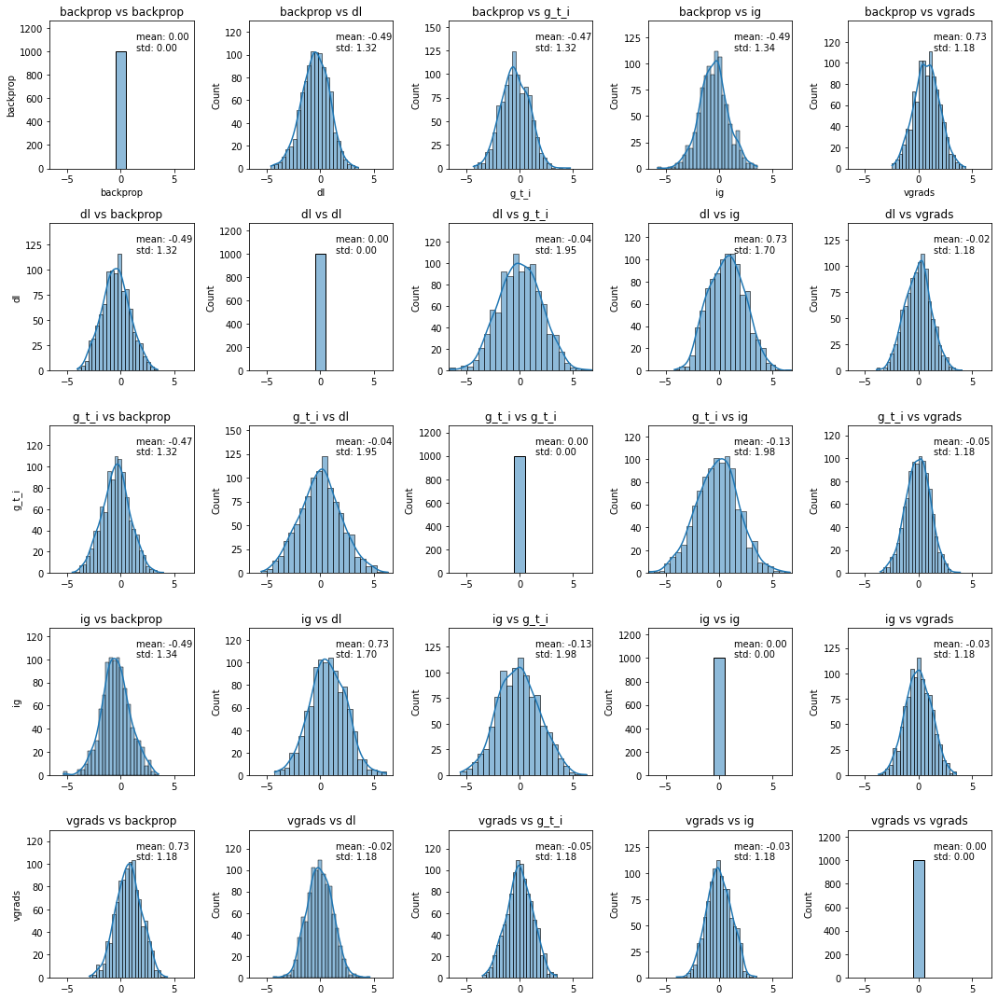

In [108]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

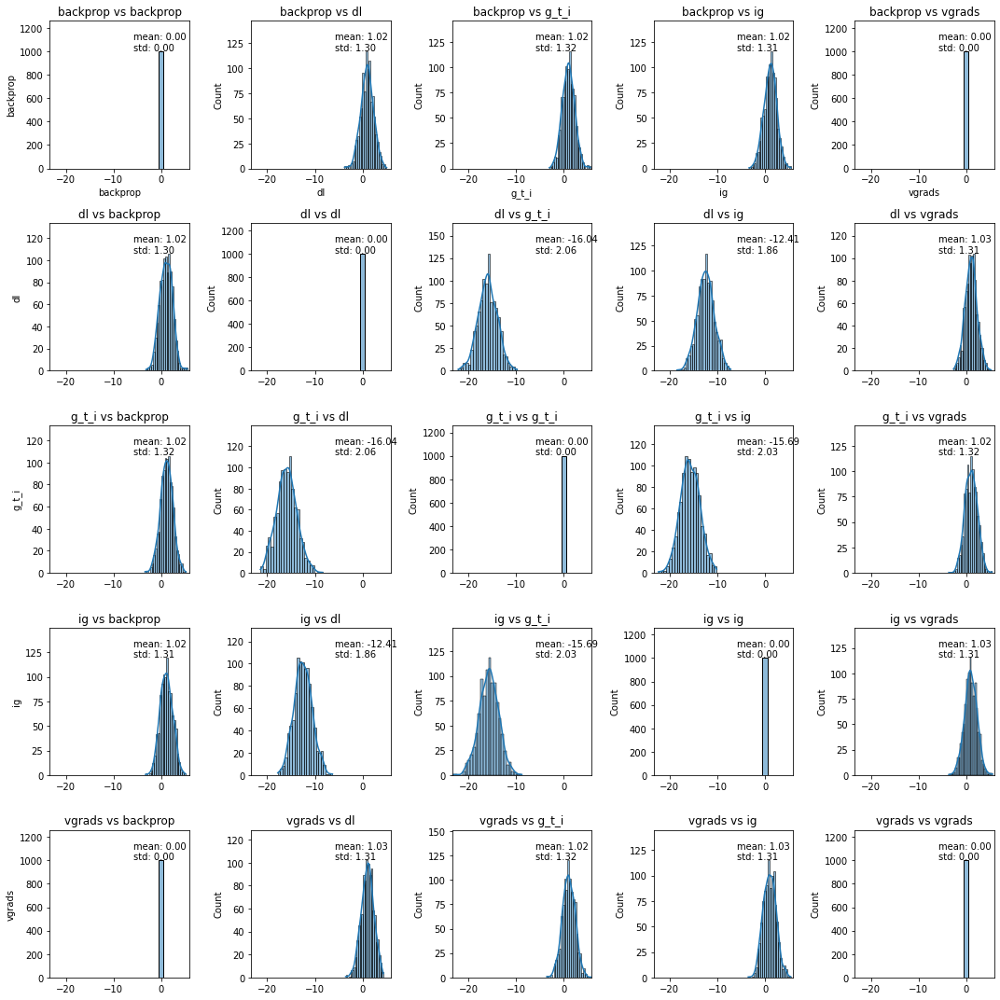

In [109]:
plot_gaussian_distributions(
    distances=difference_kpca_linear_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (poly)

### No Attack

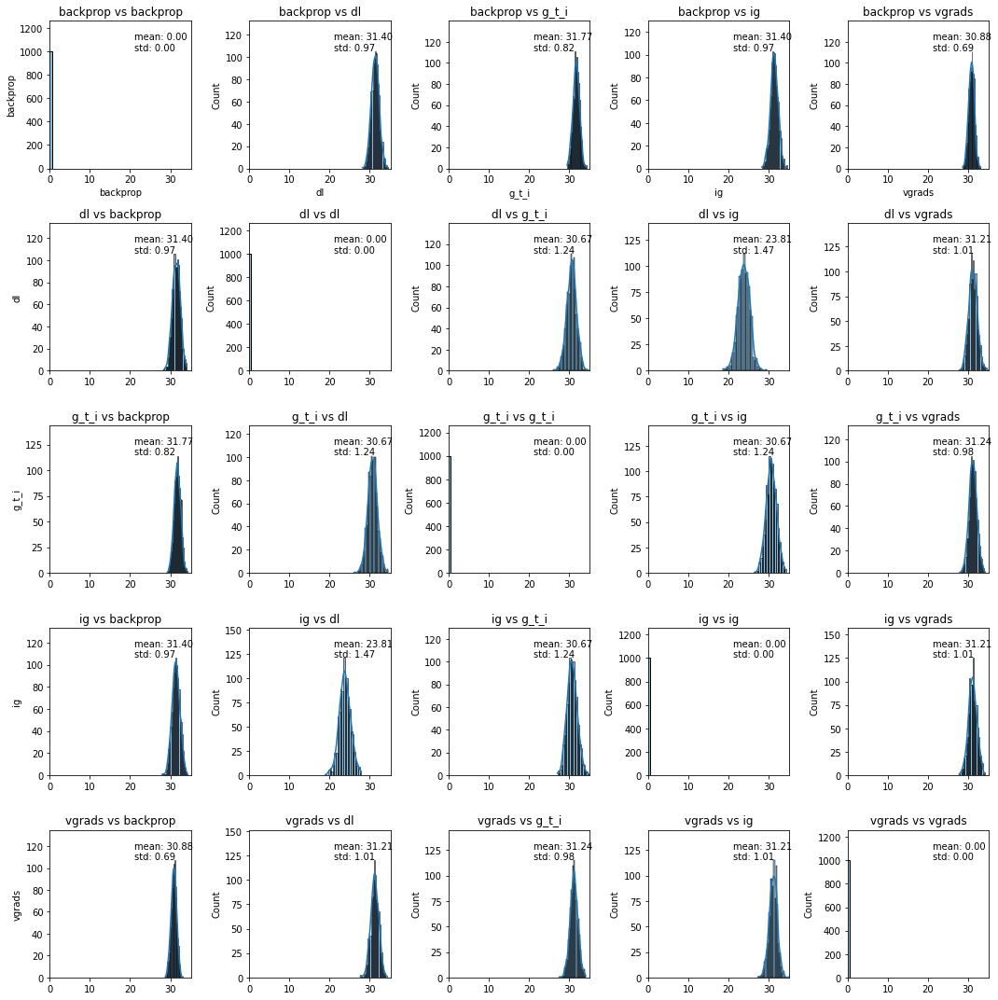

In [110]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

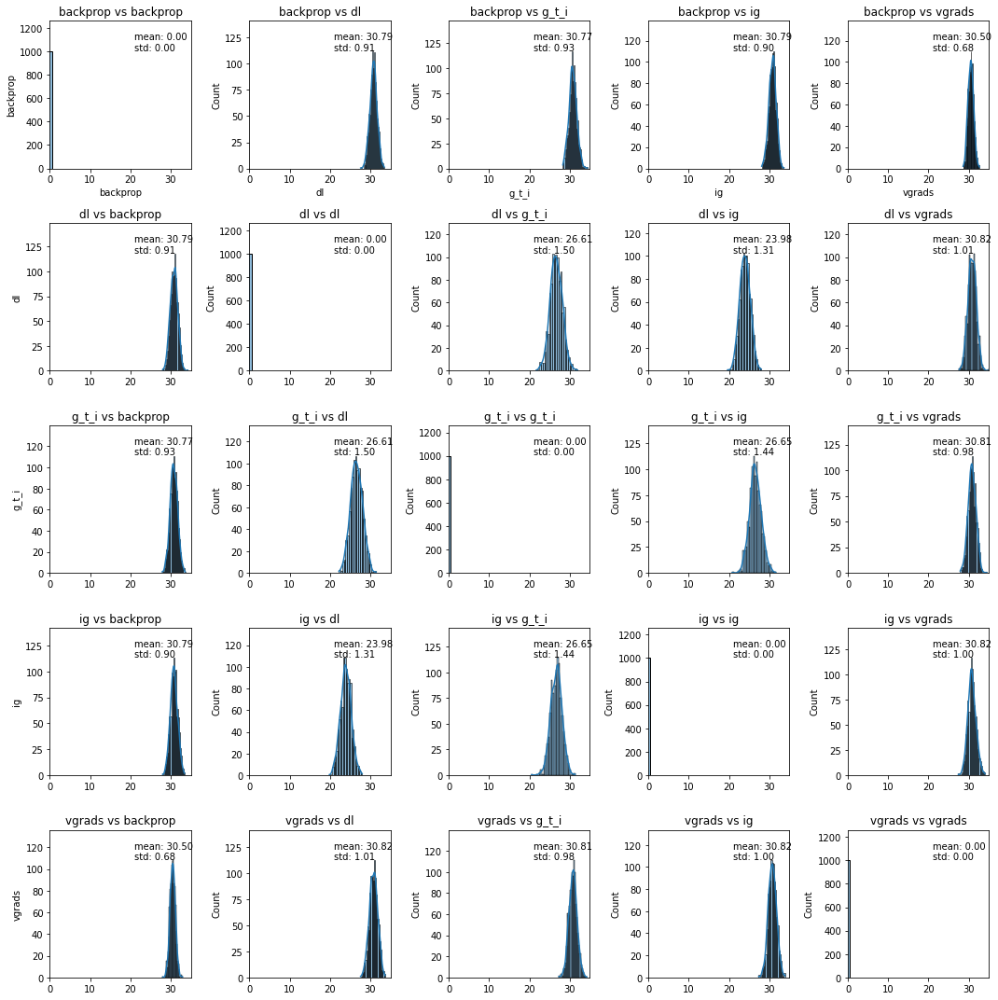

In [111]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

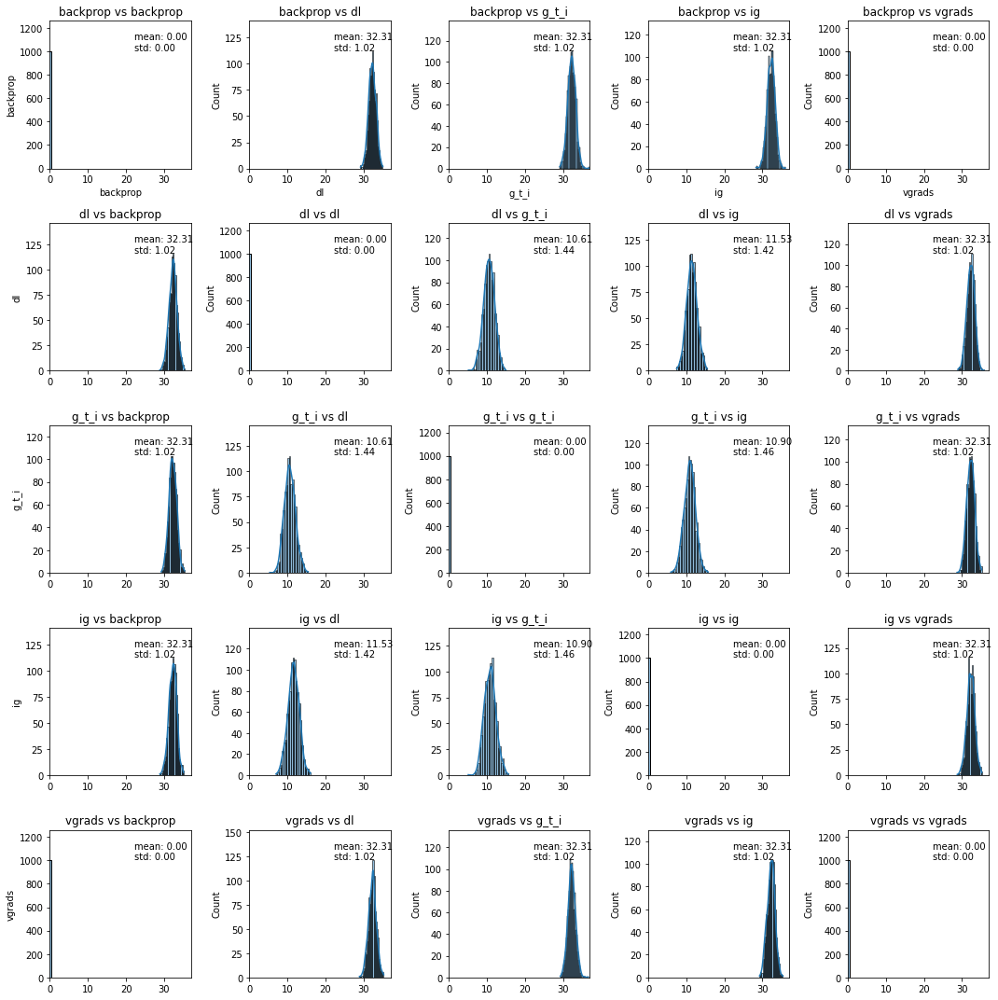

In [112]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_poly_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

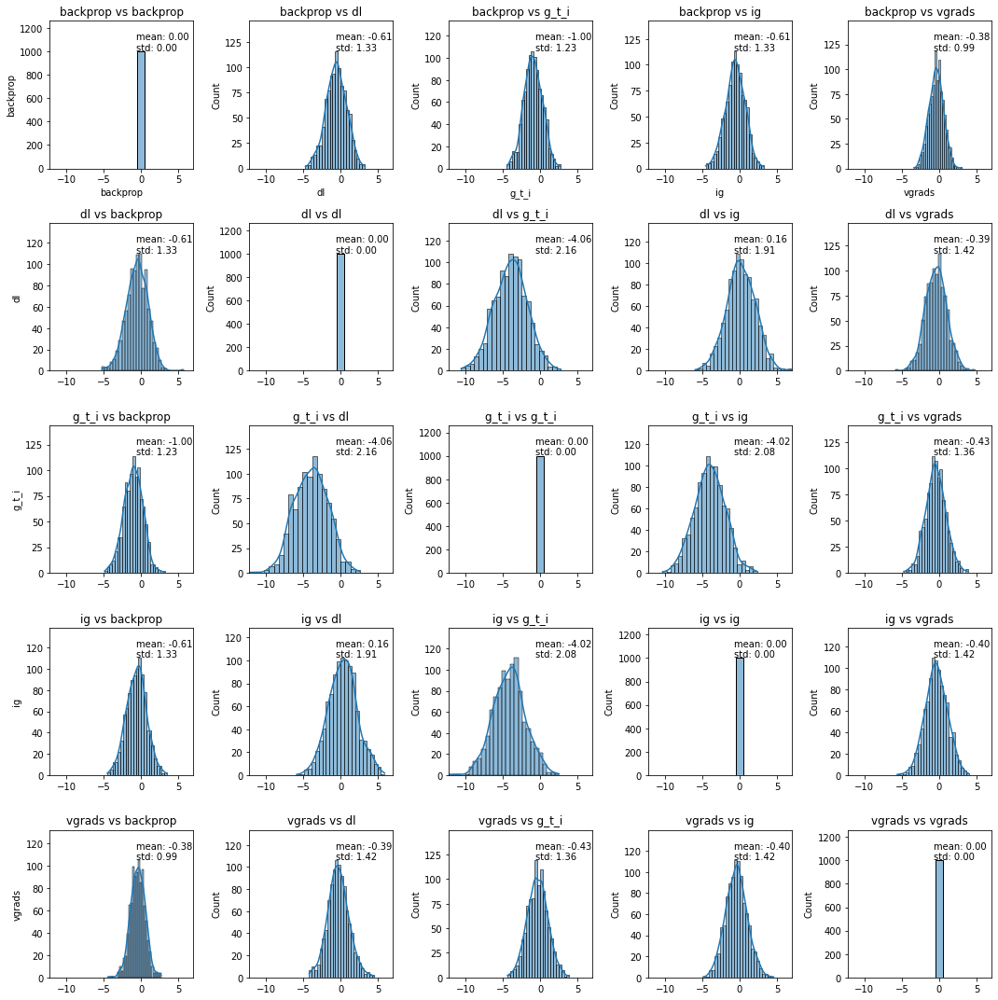

In [113]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

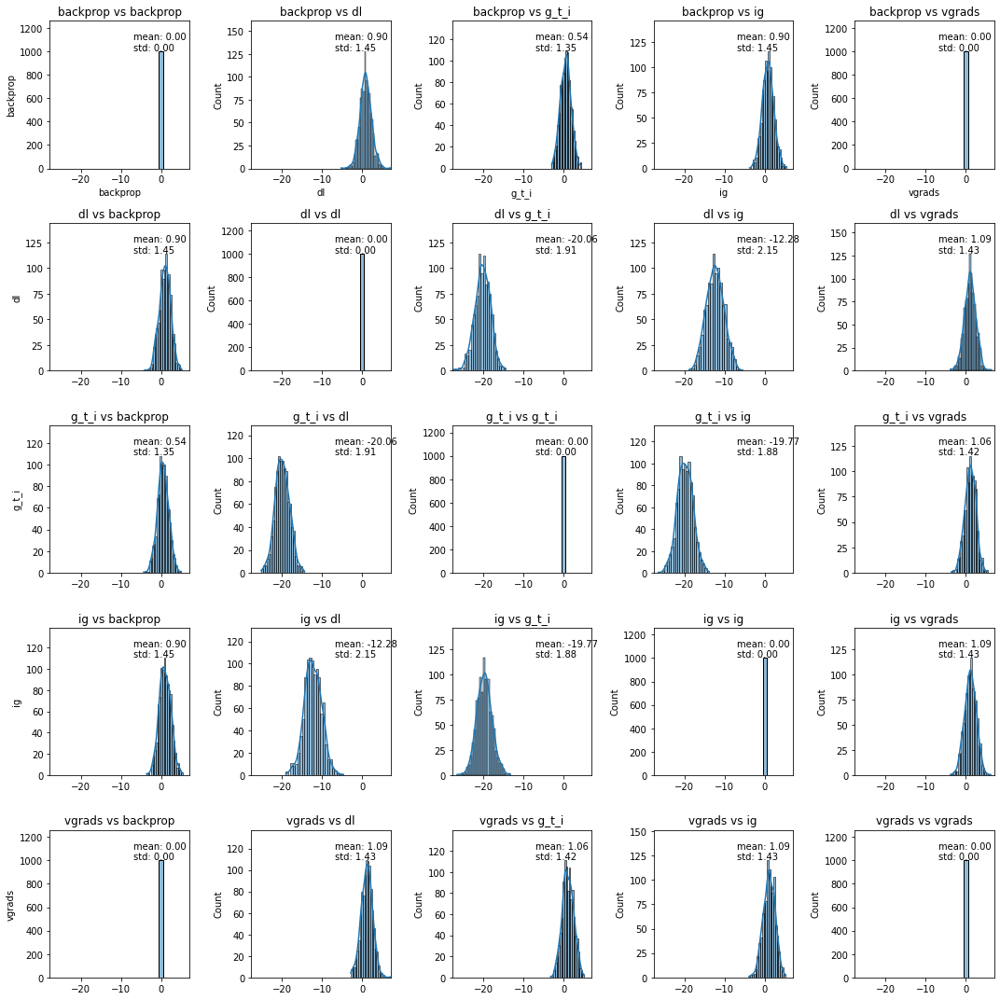

In [114]:
plot_gaussian_distributions(
    distances=difference_kpca_poly_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## kPCA (cosine)

### No Attack

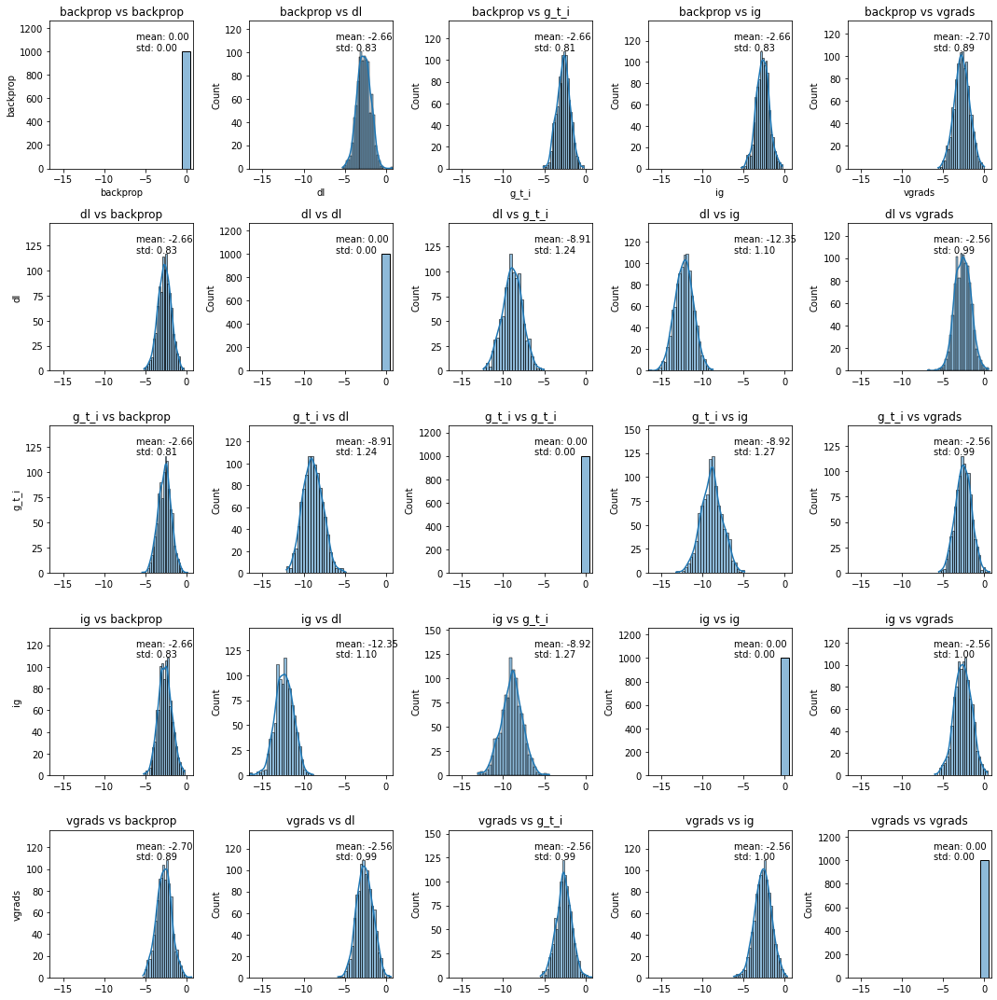

In [115]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

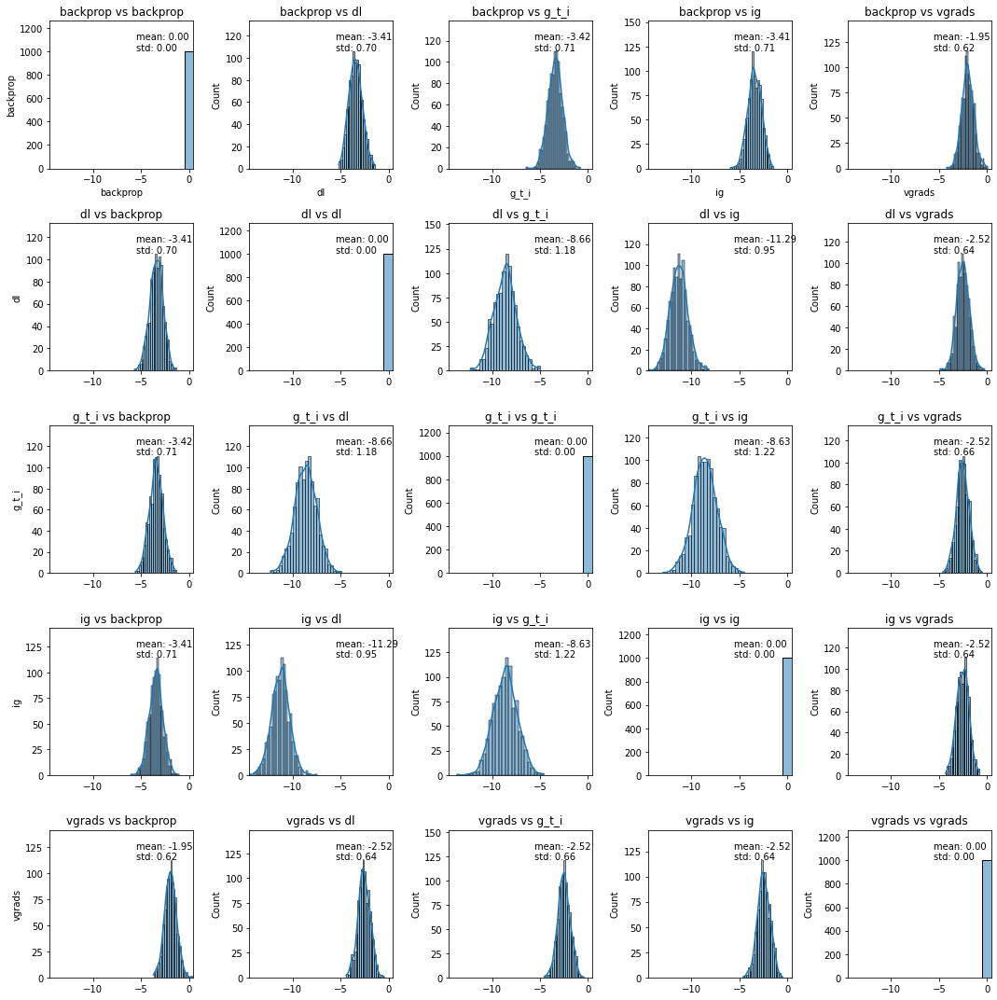

In [116]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

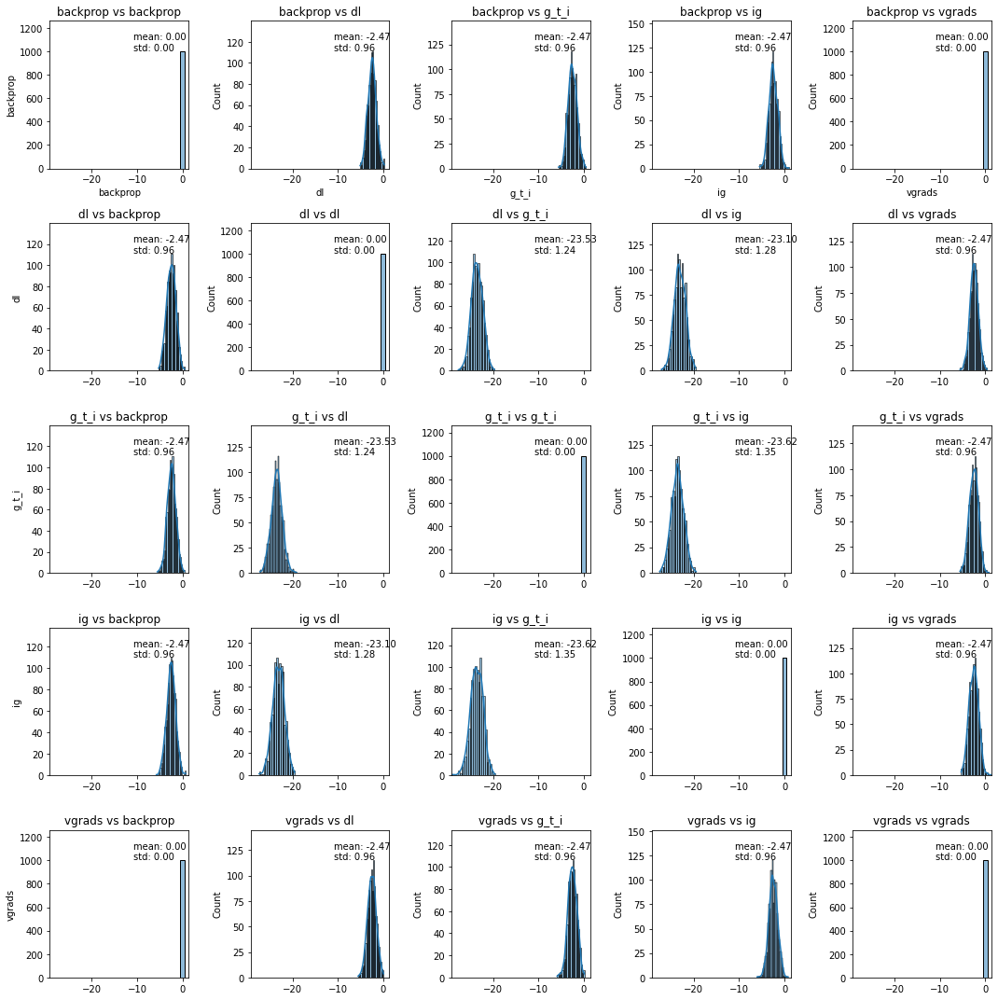

In [117]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_kcpa_cosine_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

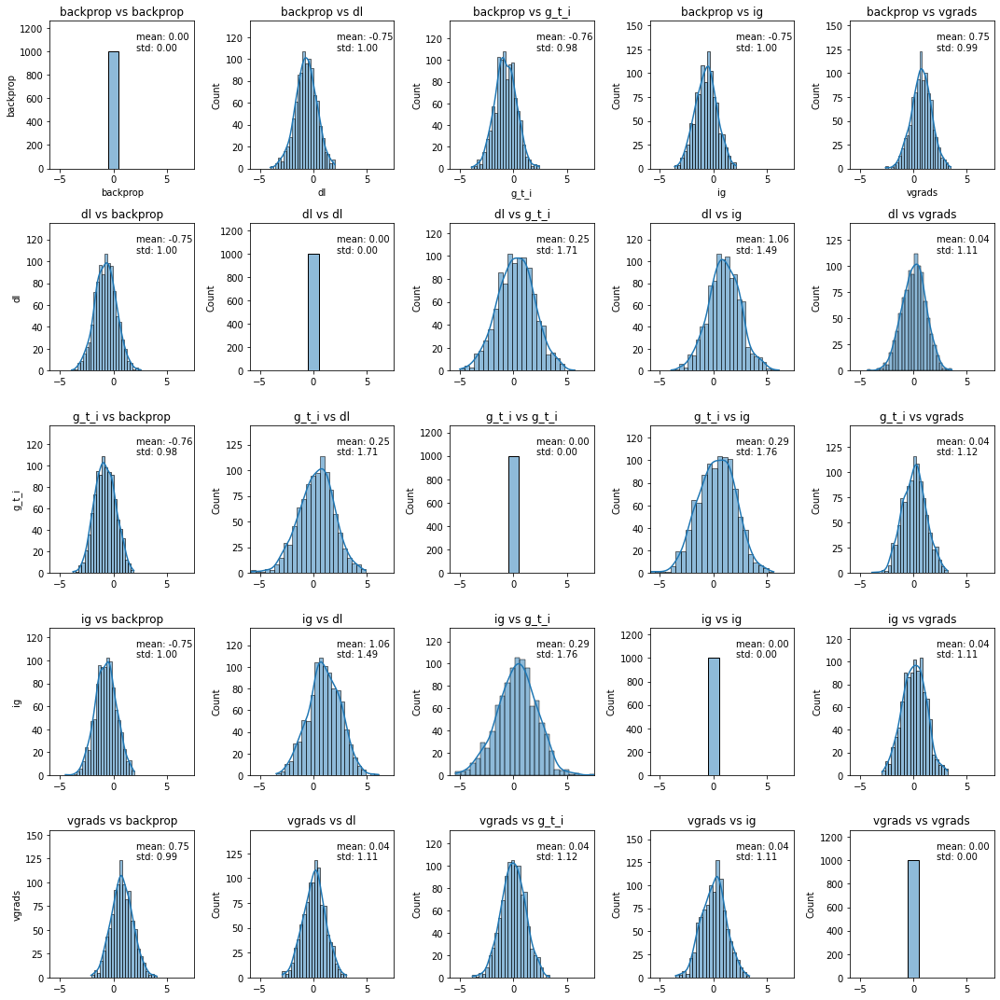

In [118]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

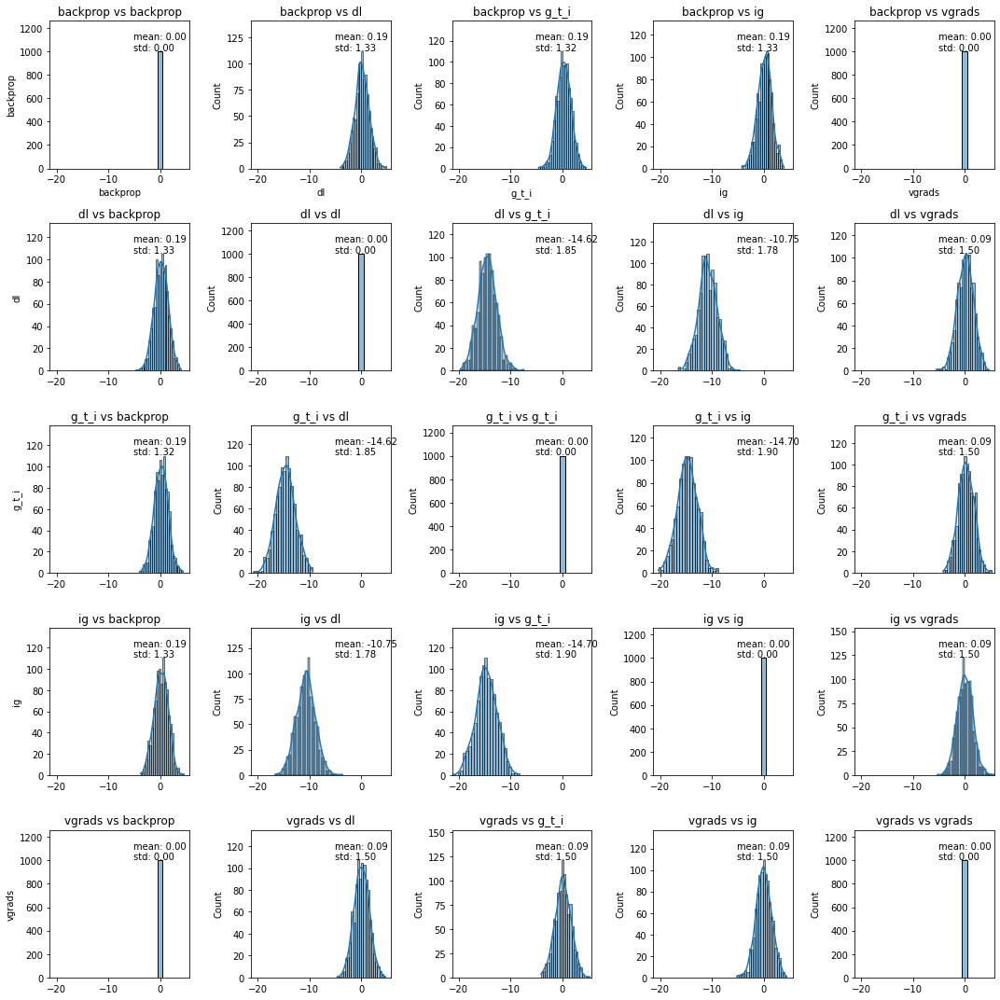

In [119]:
plot_gaussian_distributions(
    distances=difference_kpca_cosine_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)

## tSNE

### No Attack

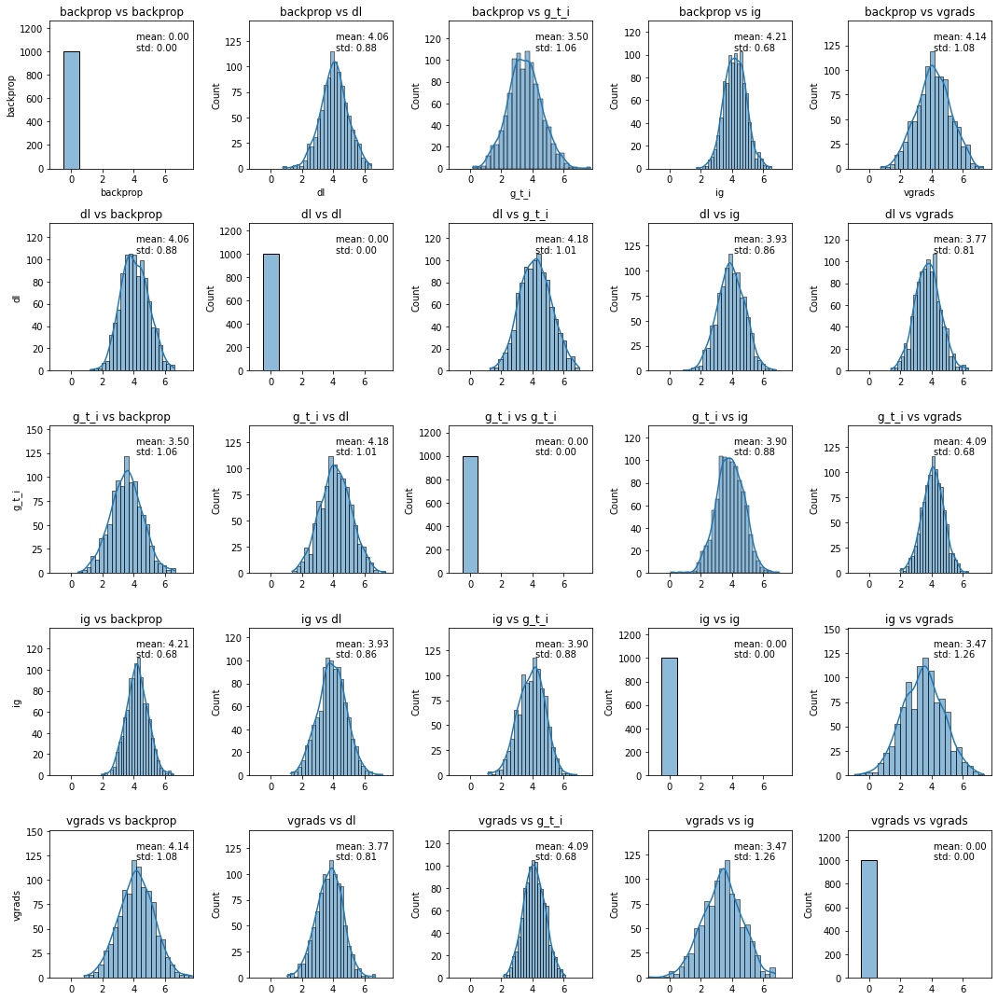

In [120]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_1), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandLabels Attack

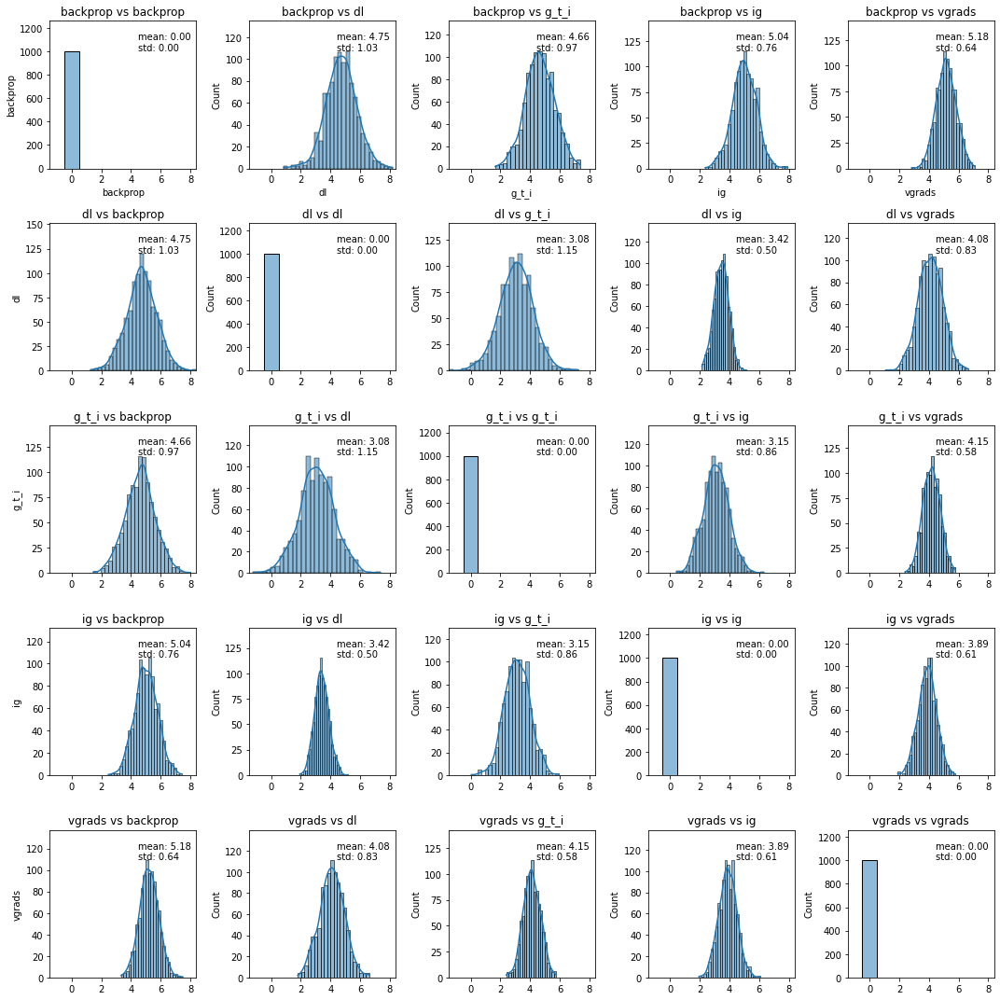

In [121]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_2), 
    techniques=list(techniques), 
    metric=METRIC
)

### RandParams Attack

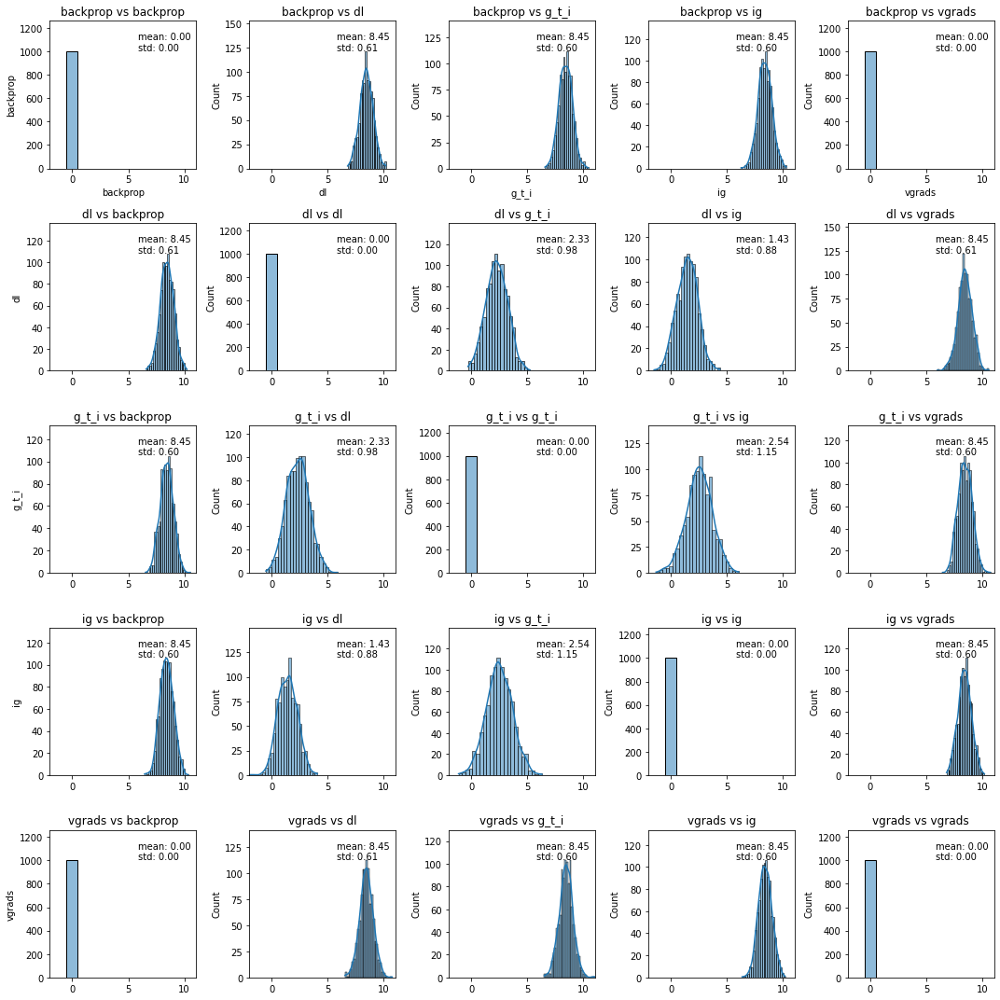

In [122]:
plot_gaussian_distributions(
    distances=apply_log_to_distances(distances_tsne_3), 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandLabels (Difference)

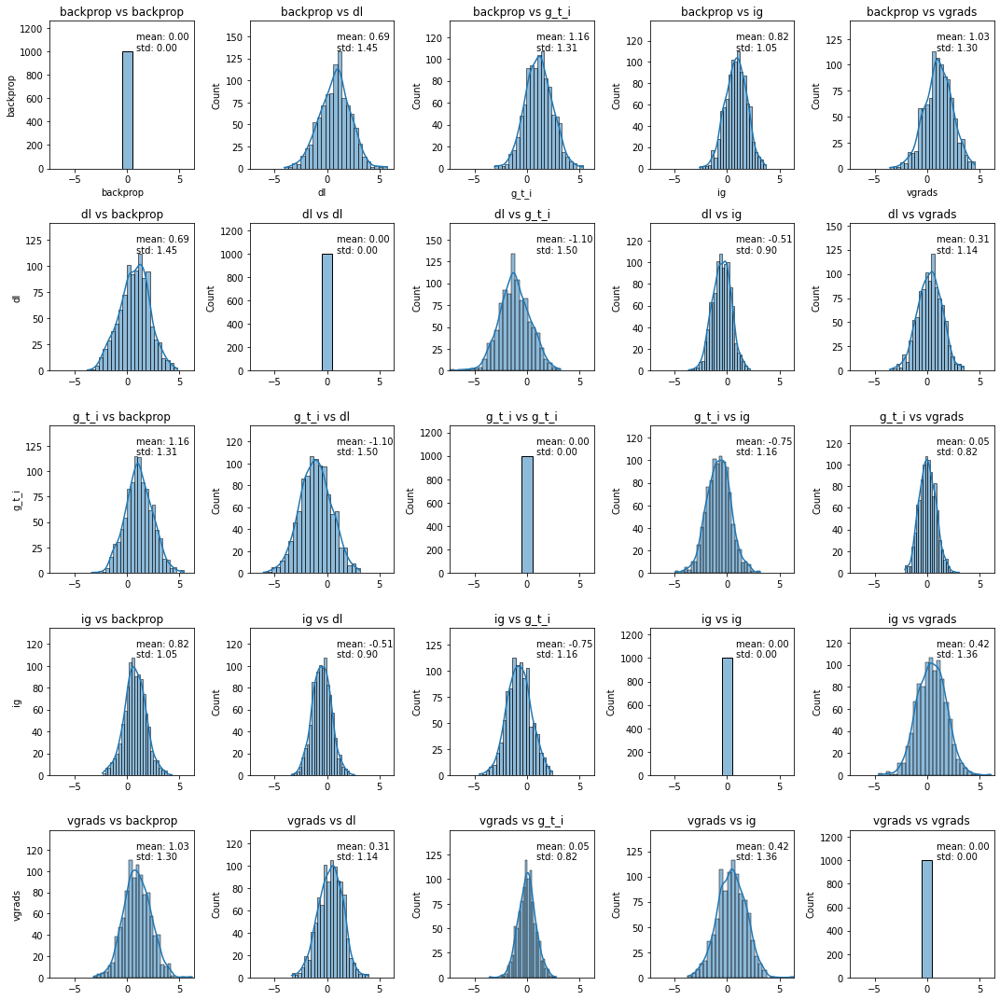

In [123]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandLabels, 
    techniques=list(techniques), 
    metric=METRIC
)

### No Attack vs. RandParams (Difference)

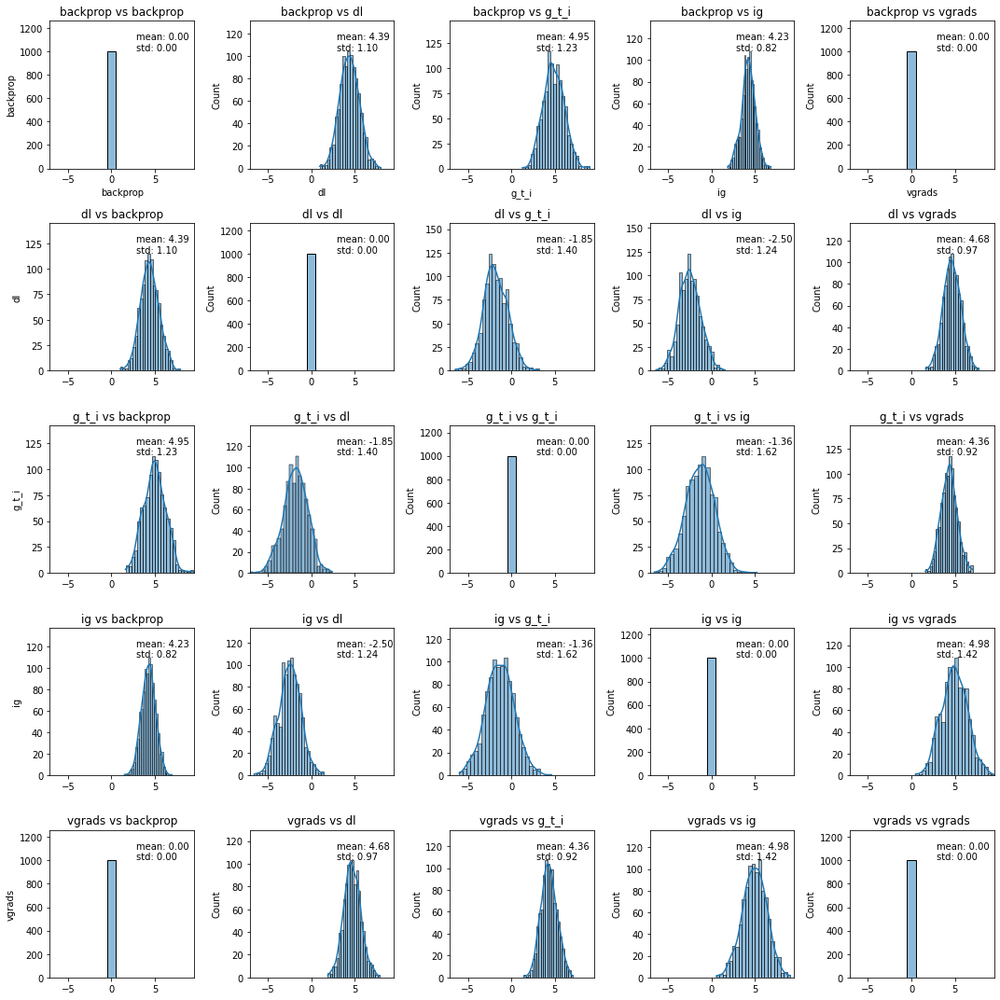

In [124]:
plot_gaussian_distributions(
    distances=difference_tsne_NoAttacked_RandParams, 
    techniques=list(techniques), 
    metric=METRIC
)